# PREPARE UMAP EMBEDDER

In [1]:
import torch #should be installed by default in any colab notebook
import numpy as np
import matplotlib.pyplot as plt
import json
import os
import panda### ms as pd
from time import time
import plotly.express as px
import pickle
from umap import UMAP

2022-01-26 12:05:53.677583: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.10.1


In [2]:
from torch.utils.data import Dataset
from torchvision.io import read_image
from torch.utils.data import DataLoader

class ImageDataset(Dataset):
    def __init__(self, GT_file_path, images_dir_path):
        self.df_GTs = pd.DataFrame.from_dict(json.load(open(GT_file_path)))
        self.images_dir_path = images_dir_path
        self.len_data = len(self.df_GTs)

    def __len__(self):
        return self.len_data

    def __getitem__(self, idx):
        img_path = f"{self.images_dir_path}/IM_{self.df_GTs.iloc[idx,0]}_phiCR_{self.df_GTs.iloc[idx,1]}.png"
        image = read_image(img_path) #[1, 2X+1, 2X+1] torch tensor
        label = torch.Tensor([float(self.df_GTs.iloc[idx, 1])]).type(torch.float32) #[1] torch tensor of float32
        return image, label

In [3]:
GT_file_path_train = f"/home/oiangu/Desktop/Conical_Refraction_Polarimeter/OUTPUT/NOISY/TRAIN/GROUND_TRUTHS.json"
images_dir_path_train =f"/home/oiangu/Desktop/Conical_Refraction_Polarimeter/OUTPUT/NOISY/TRAIN/" 

num_images=3200
umap_dims=10
min_dist=0.1
n_neighbours=700
metric='hamming'

training_data = ImageDataset(GT_file_path_train, images_dir_path_train)

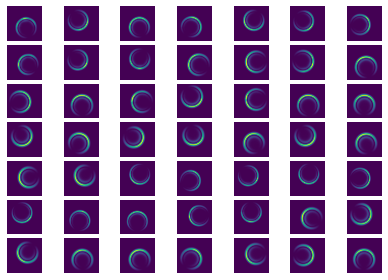

In [4]:
fig, ax_array = plt.subplots(7, 7)
axes = ax_array.flatten()
for i, ax in enumerate(axes):
    im, lab = training_data[i]
    ax.imshow(im[0])
plt.setp(axes, xticks=[], yticks=[], frame_on=False)
plt.tight_layout(h_pad=0.4, w_pad=0.0001)

In [10]:
np.random.seed(seed)
random_indices = np.random.choice(range(len(training_data)), num_images, replace=False)
#random_indices = np.random.choice(range(2850), num_images, replace=False)
X21 = training_data[0][0].shape[1]
x = np.zeros( (num_images, X21**2), dtype=np.float32)
y = np.zeros((num_images), dtype=np.float64)

for j,idx in enumerate(random_indices):
    im, lab = training_data[idx]
    x[j, :] = im[0].flatten()
    y[j] = lab   

df = pd.DataFrame({'y':y})
df['phiCR'] = df["y"].astype(str)

In [6]:
umap_embedder = UMAP(n_components=umap_dims, min_dist=min_dist, n_neighbors=n_neighbours, metric=metric) #euclidean, canberra, cosine, manhattan, braycurtis, mahalanobis, hamming
save_stuff_path = f"/home/oiangu/Hippocampus/Conical_Refraction_Polarimeter/OUTPUT/LIBRARIES_OF_THEORETICAL_D/Basler_like_R0_300x_w0_300x_Z_50x_64bit/SIMULATIONS/UMAP_Regressor/"
f_name = f'THIRD_UMAP_EMBEDDER_num_images_{num_images}_umap_dims_{umap_dims}_min_dist_{min_dist}_n_neighbours_{n_neighbours}_metric_{metric}_decimals_{decimals}_seed_{seed}.sav'

Fit the embedder.

In [7]:
umap_embedder = umap_embedder.fit(x, y=(np.around(y+np.pi, 2)*100).astype(int))

/home/oiangu/anaconda3/lib/python3.8/site-packages/umap/umap_.py:1802: UserWarning: gradient function is not yet implemented for hamming distance metric; inverse_transform will be unavailable
  warn(


Save the fitted embedder.

In [8]:
pickle.dump(umap_embedder, open(save_stuff_path+f_name, 'wb'))

Load fitted embedder.

In [7]:
umap_embedder = pickle.load((open(save_stuff_path+f_name, 'rb')))

We can visualize the quality of the embedding with a PCA to 2 and 3 dims.

In [11]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2)

principalComponents = pca.fit_transform(umap_embedder.embedding_)
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2'])
df['principal component 1'] = principalDf['principal component 1']
df['principal component 2'] = principalDf['principal component 2']

In [12]:
from io import BytesIO
from PIL import Image
import base64
from bokeh.plotting import figure, show, output_notebook
from bokeh.models import HoverTool, ColumnDataSource, LinearColorMapper
from bokeh.palettes import Spectral10

output_notebook()

def embeddable_image(data):
    img_data = data.values.reshape(X21,X21).astype(np.uint8)
    image = Image.fromarray(img_data, mode='L').resize((64, 64), Image.BICUBIC)
    buffer = BytesIO()
    image.save(buffer, format='png')
    for_encoding = buffer.getvalue()
    return 'data:image/png;base64,' + base64.b64encode(for_encoding).decode()

df['image'] = pd.DataFrame(data=x, columns=list(range(x.shape[1]))).apply(embeddable_image, axis=1)

datasource = ColumnDataSource(df)
color_mapping = LinearColorMapper(
    palette='Magma256',
    low=y.min(),
    high=y.max()
)

plot_figure = figure(
    title='PCA projection of the CR dataset',
    plot_width=800,
    plot_height=800,
    tools=('pan, wheel_zoom, reset')
)

plot_figure.add_tools(HoverTool(tooltips="""
<div>
    <div>
        <img src='@image' style='float: left; margin: 5px 5px 5px 5px'/>
    </div>
    <div>
        <span style='font-size: 16px; color: #224499'>phiCR:</span>
        <span style='font-size: 18px'>@phiCR</span>
    </div>
</div>
"""))

plot_figure.circle(
    'principal component 1',
    'principal component 2',
    source=datasource,
    color=dict(field='phiCR', transform=color_mapping),
    line_alpha=0.6,
    fill_alpha=0.6,
    size=7
)
show(plot_figure)

Loading BokehJS ...

In [13]:
from sklearn.decomposition import PCA
pca = PCA(n_components=3)

principalComponents = pca.fit_transform(umap_embedder.embedding_)
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2', 'principal component 3'])
df['principal component 1'] = principalDf['principal component 1']
df['principal component 2'] = principalDf['principal component 2']
df['principal component 3'] = principalDf['principal component 3']

In [14]:
fig=px.scatter_3d(df, x="principal component 1", y="principal component 2", z="principal component 3", color="y")
fig.update_traces(marker={"size":3})
fig.update_yaxes(scaleanchor="x", scaleratio=1)
fig.show()

# Save the Embedding Results in case we cannot use the Embedder itself

In [ ]:
# Initialize the hdf5 dataset saver
h5f = h5py.File(f"{save_stuff_path}/Training_Embedding.h5", 'a') # append if exists, create if not
h5f.create_dataset("Embeddings", data= umap_embedder.embedding_, compression="lzf", shuffle=True)
h5f.create_dataset("phiCRs", data= y, compression="lzf", shuffle=True)
h5f.create_dataset("ImageIndexes", data= random_indices, compression="lzf", shuffle=True)

h5f.flush()

# TRAIN FULLY CONNECTED FROM EMBEDDING TO ANGLE

In [1]:
import torch #should be installed by default in any colab notebook
import torch.nn as nn
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.pyplot as plt
import json
import os
import pandas as pd
import h5py
from time import time
from datetime import datetime
from IPython import display as display_IPython
import pickle
#from umap import UMAP

assert torch.cuda.is_available(), "GPU is not enabled"

# use gpu if available
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

## Define the Model

In [2]:
from collections import OrderedDict

class Embedding_to_Angle_Arbitrary_Depth_Width(nn.Module):
    def __init__(self, embedding_dims, X=302, hidden_layers=4, # an extra layer will be added to a single neuron
                 out_fc_s = [20,10,10,5], dropouts = [0.2,0.4,0.2,0.4]
                ): 
        super(Embedding_to_Angle_Arbitrary_Depth_Width, self).__init__()
        self.embedding_dims = embedding_dims
        self.in_fc = embedding_dims
        
        sequence=[(f'fc1', nn.Linear(embedding_dims, out_fc_s[0])), (f'ReLU1', nn.ReLU()), 
                  (f'Dropout1', nn.Dropout(p=dropouts[0], inplace=False))]
        for i in range(1, hidden_layers):
            sequence.append((f'fc{i+1}', nn.Linear(out_fc_s[i-1], out_fc_s[i])))
            sequence.append((f'ReLU{i+1}', nn.ReLU()))
            sequence.append((f'Dropout{i+1}', nn.Dropout(p=dropouts[i], inplace=False)))

        sequence.append((f'Linear{hidden_layers+1}', nn.Linear(out_fc_s[-1], 1)))
        self.network = nn.Sequential(OrderedDict( sequence ))

    def forward(self, x): # [batch_size, 2X+1, 2X+1] or [batch_size, 1, 2X+1, 2X+1]
        x = x.view(x.shape[0], self.embedding_dims).float() # [batch_size, embedding_dims]
        return self.network(x)
    
    def load_my_state_dict(self, state_dict):
        own_state = self.state_dict()
        for name, param in state_dict.items():
            if (name not in own_state) and ('network.'+name not in own_state):
                print(name)
                continue
            if (name not in own_state):
                name='network.'+name
            if isinstance(param, nn.Parameter):
                # backwards compatibility for serialized parameters
                param = param.data
            print(f"{name} {param.shape} {own_state[name].shape}")
            if param.shape==own_state[name].shape:
                own_state[name].copy_(param)
   
    
class Embedding_to_Angle(nn.Module):
    def __init__(self, embedding_dims, X=302, 
                 out_fc_1=20, out_fc_2=10, out_fc_3=10, out_fc_4=5,
                 dropout_p1=0.4, dropout_p2=0.2
                ): 
        super(Embedding_to_Angle, self).__init__()
        self.embedding_dims = embedding_dims
        self.in_fc = embedding_dims
        
        self.fc1 = nn.Linear(in_features=self.in_fc, out_features=out_fc_1, bias=True)
        self.fc2 = nn.Linear(in_features=out_fc_1, out_features=out_fc_2, bias=True)
        self.fc3 = nn.Linear(in_features=out_fc_2, out_features=out_fc_3, bias=True)
        self.fc4 = nn.Linear(in_features=out_fc_3, out_features=out_fc_4, bias=True)
        self.fc5 = nn.Linear(in_features=out_fc_4, out_features=1, bias=True)

        self.dropout1 = nn.Dropout(p=dropout_p1, inplace=False)
        self.dropout2 = nn.Dropout(p=dropout_p2, inplace=False)
        self.relu = torch.nn.functional.relu

        #self.batchNorm2 = nn.BatchNorm2d(num_features=feats_2)
        #self.batchNorm4 = nn.BatchNorm2d(num_features=feats_4)

    def forward(self, x): # [batch_size, 2X+1, 2X+1] or [batch_size, 1, 2X+1, 2X+1]
        x = x.view(x.shape[0], self.embedding_dims).float() # [batch_size, embedding_dims]
        x = self.relu( self.fc1( x ) ) # [batch_size, out_fc_1]
        x = self.dropout1( self.relu( self.fc2( x ) ) ) # [batch_size, out_fc_2]
        x = self.dropout2( self.relu( self.fc3( x ) ) ) # [batch_size, out_fc_3]
        x = self.dropout1( self.relu( self.fc4( x ) ) ) # [batch_size, out_fc_4]
        x = self.fc5( x )                                 # [batch_size, 1]        
        return x   

In [3]:
# subroutine to count number of parameters in the model
def get_n_params(model):
    np=0
    for p in list(model.parameters()):
        np += p.numel()
    return np

## Routines to validate and train

In [4]:
@torch.no_grad()  # prevent this function from computing gradients 
def validate_epoch(criterion, model, dataloader, per_epoch_use_max_batches=None): #show_confusion_matrix = False):
    if per_epoch_use_max_batches is None:
        per_epoch_use_max_batches = len(dataloader)
    val_loss = 0
    max_abs_error = torch.Tensor([0]).to(device)
    mean_abs_error = 0
    preds = torch.Tensor().to(device)
    targets = torch.Tensor().to(device)

    model.eval() # disable the dropout, among others

    for batch_id in range(len(dataloader)):  
        data, target = dataloader[batch_id] # dataloader sends them to device already   
        prediction = model(data)
        target = target.view(prediction.shape)
        loss = criterion(prediction, target)
        val_loss += loss.item()             
        max_abs_error = torch.maximum(torch.max(torch.abs(prediction-target), 0).values, max_abs_error)
        mean_abs_error += torch.mean(torch.abs(prediction-target), 0)
        if batch_id % per_epoch_use_max_batches == per_epoch_use_max_batches-1:
            break
    val_loss /= min(len(dataloader), per_epoch_use_max_batches)
    mean_abs_error /= min(len(dataloader), per_epoch_use_max_batches)
    #accuracy = 100. * correct / len(loader.dataset)
    print(f'\nValidation set: Average loss: {val_loss:.4f}, Average Abs Error: {np.array(mean_abs_error.cpu())}, Maximum Abs Error: {np.array(max_abs_error.cpu())} \n')

    #if show_confusion_matrix:
    #    visualize_confusion_matrix(preds.to(torch.device('cpu')), targets.to(torch.device('cpu')))

    return val_loss


def train_epoch(epoch, criterion, model, optimizer, dataloader, print_loss_every_batches=20,
                optimizer_step_every_batches=1, per_epoch_use_max_batches=None):
    if per_epoch_use_max_batches is None:
        per_epoch_use_max_batches = len(dataloader)
        
    total_loss = 0.0

    model.train()

    optimizer.zero_grad()
    #t = time()
    random_indices = np.random.choice(range(len(dataloader)), len(dataloader), replace=False)
    for batch_id, idx in enumerate(random_indices):  
        data, target = dataloader[idx] # dataloader sends them to device already
        #data, target = data.to(device), target.to(device)
        prediction = model(data) # data is [batch_size, embedding_dim]
        loss = criterion(prediction, target)
        loss.backward()
        
        if batch_id % optimizer_step_every_batches==optimizer_step_every_batches-1:
            optimizer.step()
            optimizer.zero_grad()
        # print loss every N batches
        if batch_id % print_loss_every_batches == print_loss_every_batches-1:
            print('Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}'.format(
                epoch, (batch_id+1) * len(data), len(dataloader)*dataloader.batch_size,
                100*(batch_id+1)*len(data) / (len(dataloader)*dataloader.batch_size), loss.item()))

        #if batch_id % per_epoch_use_max_batches == per_epoch_use_max_batches-1:
        #    break


        total_loss += loss.item()  #.item() is very important here
        # In order to avoid having total_loss as a tensor in the gpu
        #t = time()

    return total_loss / min(len(dataloader), per_epoch_use_max_batches)

## The full training loop

In [5]:
def full_training_loop(model, criterion, optimizer, train_loader, test_loader, epochs=10,
                       print_loss_every_batches=20, validate_every_epochs=2, optimizer_step_every_batches=1,
                      per_epoch_use_max_train_batches=None, per_epoch_use_max_test_batches=None,
                      image_path=None, save_model_every_epochs=1, model_path=None, best_model_path=None):
    losses = {"train": [], "val": []}
    %matplotlib inline
    for epoch in range(epochs):

        train_loss = train_epoch(epoch, criterion, model, optimizer, train_loader,
                                 print_loss_every_batches=print_loss_every_batches,
                                optimizer_step_every_batches=optimizer_step_every_batches,
                                per_epoch_use_max_batches=per_epoch_use_max_train_batches)
        if epoch%validate_every_epochs==0 and epoch!=0:
            val_loss = validate_epoch(criterion, model, test_loader, per_epoch_use_max_test_batches)
        else:
            try:
                val_loss = losses["val"][-1]
            except:
                val_loss = train_loss
        if epoch and train_loss<=min(losses["train"]) and best_model_path:
            torch.save({
            'model': model.state_dict(),
            'optimizer': optimizer.state_dict(),
            }, best_model_path)
        
        losses["train"].append(train_loss)
        losses["val"].append(val_loss)        
        plt.plot(losses["train"], label="training loss")
        plt.plot(losses["val"], label="validation loss")
        #plt.yscale('log')
        plt.legend()
        if image_path is not None:
            plt.savefig(image_path)
            plt.clf()
        else:
            display_IPython.clear_output(wait=True)
            plt.pause(0.001)
            plt.show()
        if epoch % save_model_every_epochs==save_model_every_epochs-1 and model_path:
            torch.save({
            'model': model.state_dict(),
            'optimizer': optimizer.state_dict(),
            }, model_path)

    return losses

## The Dataset class and Data Sampler

In [6]:
from torch.utils.data import Dataset
from torchvision.io import read_image
from torch.utils.data import DataLoader

class EmbeddingImageDataset(Dataset):
    def __init__(self, GT_file_path, images_dir_path, embedder):
        self.df_GTs = pd.DataFrame.from_dict(json.load(open(GT_file_path)))
        self.images_dir_path = images_dir_path
        self.len_data = len(self.df_GTs)
        self.embedder = embedder
        #self.embdding_dims = embedder.embedding_.shape[-1]

    def __len__(self):
        return self.len_data

    def __getitem__(self, idx):
        img_path = f"{self.images_dir_path}/IM_{self.df_GTs.iloc[idx,0]}_phiCR_{self.df_GTs.iloc[idx,1]}.png"
        image = read_image(img_path) #[1, 2X+1, 2X+1] torch tensor
        #embedding=image
        embedding = torch.Tensor(self.embedder.transform(image.flatten().unsqueeze(0))) # [1, embedding_dims]
        label = torch.Tensor([float(self.df_GTs.iloc[idx, 1])]).type(torch.float32) #[1] torch tensor of float32
        return embedding, label
    
class EmbeddingDataset(Dataset):
    def __init__(self, h5f_full_path):
        self.h5f = h5py.File(f"{h5f_full_path}", 'r')
        self.num_batches = len(self.h5f)
        self.batch_size = self.h5f['0'].shape[0]
        self.feature_num = self.h5f['0'].shape[1]-2
        print(f"There are {self.batch_size} images per batch\nwith {self.feature_num} features per data\nand {self.num_batches} batches in total")
        print(f"A total of {self.batch_size*self.num_batches} samples.")

    def __len__(self):
        return self.num_batches

    def __getitem__(self, idx):
        data_and_label = torch.tensor(np.array(self.h5f[str(idx)]), device=device)
        return data_and_label[:,:-2], data_and_label[:,-2].unsqueeze(1)

## Initialize the dataset and sampler (choose the number of batches per epoch, and their length) and fix the artificial noise hyperparameters

In [8]:
#GT_file_path_train = f"/home/oiangu/Hippocampus/Conical_Refraction_Polarimeter/OUTPUT/LIBRARIES_OF_THEORETICAL_D/Basler_like_R0_300x_w0_300x_Z_50x_64bit/IMAGE_LIBRARY/NON_NOISY/TRAIN/GROUND_TRUTHS.json"
#images_dir_path_train =f"/home/oiangu/Hippocampus/Conical_Refraction_Polarimeter/OUTPUT/LIBRARIES_OF_THEORETICAL_D/Basler_like_R0_300x_w0_300x_Z_50x_64bit/IMAGE_LIBRARY/NON_NOISY/TRAIN/" 
#GT_file_path_test = f"/home/oiangu/Hippocampus/Conical_Refraction_Polarimeter/OUTPUT/LIBRARIES_OF_THEORETICAL_D/Basler_like_R0_300x_w0_300x_Z_50x_64bit/IMAGE_LIBRARY/NON_NOISY/TEST/GROUND_TRUTHS.json"
#images_dir_path_test = f"/home/oiangu/Hippocampus/Conical_Refraction_Polarimeter/OUTPUT/LIBRARIES_OF_THEORETICAL_D/Basler_like_R0_300x_w0_300x_Z_50x_64bit/IMAGE_LIBRARY/NON_NOISY/TEST/"

save_stuff_path = f"/home/oiangu/Hippocampus/Conical_Refraction_Polarimeter/OUTPUT/LIBRARIES_OF_THEORETICAL_D/Basler_like_R0_300x_w0_300x_Z_50x_64bit/SIMULATIONS/UMAP_Regressor/"

# Image directories
#GT_file_path_train = f"/home/oiangu/Desktop/Conical_Refraction_Polarimeter/OUTPUT/NOISY/TRAIN/GROUND_TRUTHS.json"
#images_dir_path_train =f"/home/oiangu/Desktop/Conical_Refraction_Polarimeter/OUTPUT/NOISY/TRAIN/" 
#GT_file_path_test = f"/home/oiangu/Desktop/Conical_Refraction_Polarimeter/OUTPUT/NOISY/TEST/GROUND_TRUTHS.json"
#images_dir_path_test =f"/home/oiangu/Desktop/Conical_Refraction_Polarimeter/OUTPUT/NOISY/TEST/" 

# Embedding h5f file
full_path_h5f = f"{save_stuff_path}/Embedding_Datasets/Dataset_Embedding_100D_w2000_training_temp.h5"
training_data = EmbeddingDataset(full_path_h5f)

# Embedder parameters
num_images=2000
umap_dims=100
min_dist=0.1
n_neighbours=700
metric='hamming'
seed=666
decimals=2
embedder_path = save_stuff_path + \
        f'/Embedders/UMAP_EMBEDDER_num_images_{num_images}_umap_dims_{umap_dims}_min_dist_{min_dist}_n_neighbours_{n_neighbours}_metric_{metric}_decimals_{decimals}_seed_{seed}.sav'


# Training parameters
total_epochs = 1000000
#batch_size = 2 #20
validate_every_epochs = 100
optimizer_step_every_batches = 10
per_epoch_use_max_train_batches= len(training_data)+1 #12
per_epoch_use_max_test_batches=len(training_data)+1 
save_model_every_epochs = 50

exp_name='100D_13989x50_images'

# Dataloader parameters
worker_num=2

There are 50 images per batch
with 100 features per data
and 13989 batches in total
A total of 699450 samples.


In [9]:
#umap_embedder = UMAP(n_components=umap_dims, min_dist=min_dist, n_neighbors=n_neighbours, metric=metric) #euclidean, canberra, cosine, manhattan, braycurtis, mahalanobis, hamming
#umap_embedder = pickle.load((open(embedder_path, 'rb')))

In [10]:
#torch.manual_seed(678)
#training_data = EmbeddingImageDataset(GT_file_path_train, images_dir_path_train, umap_embedder)
#test_data = EmbeddingImageDataset(GT_file_path_test, images_dir_path_test, umap_embedder)

In [9]:
#train_dataloader = DataLoader(training_data, batch_size=batch_size, shuffle=True, num_workers=worker_num,
#                              pin_memory=True, drop_last=False, persistent_workers=False)
#test_dataloader = DataLoader(test_data, batch_size=batch_size, shuffle=True, num_workers=worker_num, 
#                             pin_memory=True, drop_last=False, persistent_workers=False)


#assert(len(train_dataloader)%batch_size==0 or per_epoch_use_max_train_batches%batch_size==0 ) # make batch_size an integer proportion of data files
#batch_number_per_epoch = min(len(train_dataloader)/batch_size, per_epoch_use_max_train_batches)
#assert(batch_number_per_epoch%optimizer_step_every_batches==0) # make optimizer steps every divisble number of its

## Fix hyperparameters and initialize the model and optimizer

In [9]:
embedding_dims = training_data.feature_num
#embedding_dims=umap_embedder.embedding_.shape[-1]
X=302
hidden_layers=8 # an extra layer will be added to a single neuron
out_fc_s = [1000,500,500,500, 100, 100, 100, 100]
dropouts = [0.2,0.4,0.2,0.4, 0.2, 0.4, 0.2, 0.4]
#out_fc_1=1000
#out_fc_2=500
#out_fc_3=500
#out_fc_4=500
#dropout_p1=0.4
#dropout_p2=0.2

In [11]:
model = Embedding_to_Angle_Arbitrary_Depth_Width(embedding_dims, X=X, hidden_layers=hidden_layers, # an extra layer will be added to a single neuron
                 out_fc_s = out_fc_s, dropouts = dropouts)

print(f"Number of parameters {get_n_params(model)}")

# In case we wish to transfer the learned parameters of another run
check_file="NNs/Noisy_Model_and_Optimizer_2022-02-22 21:00:06.873539_100D_13158x50_images.pt"
checkpoint = torch.load(save_stuff_path+f"/{check_file}")

# move model to gpu if available
model.to(device)

model.load_state_dict(checkpoint['model'])


# Initialize the weights of the model! Default initialization might already be fine!

# we can use a MSE loss for the regression task we have in hands
criterion = nn.MSELoss()

# we will choose as optimizer the 
#optimizer = torch.optim.Adagrad(model.parameters(), lr=0.00001, lr_decay=0.01, weight_decay=0.3,
#                                initial_accumulator_value=0, eps=1e-10)

optimizer = torch.optim.Adam(model.parameters(), lr=0.000001, betas=(0.99, 0.999), eps=1e-08, weight_decay=0, amsgrad=False)
optimizer.load_state_dict(checkpoint['optimizer'])

Number of parameters 1183001


## Run the Training

In [ ]:
%%time
losses = full_training_loop(model, criterion, optimizer, training_data, training_data, 
                    epochs=total_epochs, print_loss_every_batches=2100,
                            validate_every_epochs=validate_every_epochs,
                           optimizer_step_every_batches=optimizer_step_every_batches,
                           per_epoch_use_max_train_batches=per_epoch_use_max_train_batches, 
                            per_epoch_use_max_test_batches=per_epoch_use_max_test_batches,
                           image_path=save_stuff_path+ f"/Noisy_Training_{datetime.now()}_{exp_name}.png",
                           save_model_every_epochs=save_model_every_epochs, 
                            model_path=save_stuff_path+f"/Noisy_Model_and_Optimizer_{datetime.now()}_{exp_name}.pt",
                            best_model_path=save_stuff_path+f"/BEST_Noisy_Model_and_Optimizer_{datetime.now()}_{exp_name}.pt"
                           )
# Execute the training and validation

Train Epoch: 0 [105000/699450 (15%)]	Loss: 0.115168
Train Epoch: 0 [210000/699450 (30%)]	Loss: 0.040267
Train Epoch: 0 [315000/699450 (45%)]	Loss: 0.036725
Train Epoch: 0 [420000/699450 (60%)]	Loss: 0.077690
Train Epoch: 0 [525000/699450 (75%)]	Loss: 0.031619
Train Epoch: 0 [630000/699450 (90%)]	Loss: 0.209966
Train Epoch: 1 [105000/699450 (15%)]	Loss: 0.099102
Train Epoch: 1 [210000/699450 (30%)]	Loss: 0.616566
Train Epoch: 1 [315000/699450 (45%)]	Loss: 0.085988
Train Epoch: 1 [420000/699450 (60%)]	Loss: 0.141106
Train Epoch: 1 [525000/699450 (75%)]	Loss: 0.100875
Train Epoch: 1 [630000/699450 (90%)]	Loss: 1.929525
Train Epoch: 2 [105000/699450 (15%)]	Loss: 0.646911
Train Epoch: 2 [210000/699450 (30%)]	Loss: 0.063608
Train Epoch: 2 [315000/699450 (45%)]	Loss: 0.404670
Train Epoch: 2 [420000/699450 (60%)]	Loss: 0.046881
Train Epoch: 2 [525000/699450 (75%)]	Loss: 0.125687
Train Epoch: 2 [630000/699450 (90%)]	Loss: 0.185003
Train Epoch: 3 [105000/699450 (15%)]	Loss: 0.590595
Train Epoch:

Train Epoch: 26 [105000/699450 (15%)]	Loss: 0.329845
Train Epoch: 26 [210000/699450 (30%)]	Loss: 0.533652
Train Epoch: 26 [315000/699450 (45%)]	Loss: 0.573045
Train Epoch: 26 [420000/699450 (60%)]	Loss: 0.598700
Train Epoch: 26 [525000/699450 (75%)]	Loss: 0.058641
Train Epoch: 26 [630000/699450 (90%)]	Loss: 0.116390
Train Epoch: 27 [105000/699450 (15%)]	Loss: 0.286818
Train Epoch: 27 [210000/699450 (30%)]	Loss: 0.433513
Train Epoch: 27 [315000/699450 (45%)]	Loss: 0.076658
Train Epoch: 27 [420000/699450 (60%)]	Loss: 0.073140
Train Epoch: 27 [525000/699450 (75%)]	Loss: 0.079868
Train Epoch: 27 [630000/699450 (90%)]	Loss: 0.144310
Train Epoch: 28 [105000/699450 (15%)]	Loss: 0.133172
Train Epoch: 28 [210000/699450 (30%)]	Loss: 0.216838
Train Epoch: 28 [315000/699450 (45%)]	Loss: 0.065550
Train Epoch: 28 [420000/699450 (60%)]	Loss: 0.550250
Train Epoch: 28 [525000/699450 (75%)]	Loss: 1.332791
Train Epoch: 28 [630000/699450 (90%)]	Loss: 0.058099
Train Epoch: 29 [105000/699450 (15%)]	Loss: 0.

Train Epoch: 51 [630000/699450 (90%)]	Loss: 0.535967
Train Epoch: 52 [105000/699450 (15%)]	Loss: 0.277811
Train Epoch: 52 [210000/699450 (30%)]	Loss: 0.225433
Train Epoch: 52 [315000/699450 (45%)]	Loss: 0.050168
Train Epoch: 52 [420000/699450 (60%)]	Loss: 0.583727
Train Epoch: 52 [525000/699450 (75%)]	Loss: 0.085648
Train Epoch: 52 [630000/699450 (90%)]	Loss: 0.662698
Train Epoch: 53 [105000/699450 (15%)]	Loss: 0.209281
Train Epoch: 53 [210000/699450 (30%)]	Loss: 0.074692
Train Epoch: 53 [315000/699450 (45%)]	Loss: 0.524515
Train Epoch: 53 [420000/699450 (60%)]	Loss: 0.051809
Train Epoch: 53 [525000/699450 (75%)]	Loss: 0.058305
Train Epoch: 53 [630000/699450 (90%)]	Loss: 0.513332
Train Epoch: 54 [105000/699450 (15%)]	Loss: 0.263919
Train Epoch: 54 [210000/699450 (30%)]	Loss: 0.095139
Train Epoch: 54 [315000/699450 (45%)]	Loss: 0.093753
Train Epoch: 54 [420000/699450 (60%)]	Loss: 0.083103
Train Epoch: 54 [525000/699450 (75%)]	Loss: 0.138772
Train Epoch: 54 [630000/699450 (90%)]	Loss: 1.

Train Epoch: 77 [525000/699450 (75%)]	Loss: 1.305291
Train Epoch: 77 [630000/699450 (90%)]	Loss: 0.106437
Train Epoch: 78 [105000/699450 (15%)]	Loss: 0.666908
Train Epoch: 78 [210000/699450 (30%)]	Loss: 0.490318
Train Epoch: 78 [315000/699450 (45%)]	Loss: 0.042508
Train Epoch: 78 [420000/699450 (60%)]	Loss: 1.201845
Train Epoch: 78 [525000/699450 (75%)]	Loss: 0.145494
Train Epoch: 78 [630000/699450 (90%)]	Loss: 0.088776
Train Epoch: 79 [105000/699450 (15%)]	Loss: 0.738556
Train Epoch: 79 [210000/699450 (30%)]	Loss: 0.692568
Train Epoch: 79 [315000/699450 (45%)]	Loss: 1.547072
Train Epoch: 79 [420000/699450 (60%)]	Loss: 0.052808
Train Epoch: 79 [525000/699450 (75%)]	Loss: 0.892470
Train Epoch: 79 [630000/699450 (90%)]	Loss: 0.038277
Train Epoch: 80 [105000/699450 (15%)]	Loss: 0.060757
Train Epoch: 80 [210000/699450 (30%)]	Loss: 0.328795
Train Epoch: 80 [315000/699450 (45%)]	Loss: 0.141349
Train Epoch: 80 [420000/699450 (60%)]	Loss: 0.479221
Train Epoch: 80 [525000/699450 (75%)]	Loss: 0.

Train Epoch: 103 [210000/699450 (30%)]	Loss: 0.139918
Train Epoch: 103 [315000/699450 (45%)]	Loss: 0.653466
Train Epoch: 103 [420000/699450 (60%)]	Loss: 0.396325
Train Epoch: 103 [525000/699450 (75%)]	Loss: 0.076358
Train Epoch: 103 [630000/699450 (90%)]	Loss: 0.674203
Train Epoch: 104 [105000/699450 (15%)]	Loss: 0.585634
Train Epoch: 104 [210000/699450 (30%)]	Loss: 0.055571
Train Epoch: 104 [315000/699450 (45%)]	Loss: 1.164151
Train Epoch: 104 [420000/699450 (60%)]	Loss: 0.610566
Train Epoch: 104 [525000/699450 (75%)]	Loss: 1.637177
Train Epoch: 104 [630000/699450 (90%)]	Loss: 0.069271
Train Epoch: 105 [105000/699450 (15%)]	Loss: 0.044496
Train Epoch: 105 [210000/699450 (30%)]	Loss: 0.070671
Train Epoch: 105 [315000/699450 (45%)]	Loss: 0.189942
Train Epoch: 105 [420000/699450 (60%)]	Loss: 0.052099
Train Epoch: 105 [525000/699450 (75%)]	Loss: 0.465090
Train Epoch: 105 [630000/699450 (90%)]	Loss: 0.739168
Train Epoch: 106 [105000/699450 (15%)]	Loss: 0.452856
Train Epoch: 106 [210000/699

Train Epoch: 128 [420000/699450 (60%)]	Loss: 0.282717
Train Epoch: 128 [525000/699450 (75%)]	Loss: 2.123326
Train Epoch: 128 [630000/699450 (90%)]	Loss: 0.293243
Train Epoch: 129 [105000/699450 (15%)]	Loss: 0.220749
Train Epoch: 129 [210000/699450 (30%)]	Loss: 0.149023
Train Epoch: 129 [315000/699450 (45%)]	Loss: 0.074477
Train Epoch: 129 [420000/699450 (60%)]	Loss: 0.029709
Train Epoch: 129 [525000/699450 (75%)]	Loss: 0.049976
Train Epoch: 129 [630000/699450 (90%)]	Loss: 0.162715
Train Epoch: 130 [105000/699450 (15%)]	Loss: 0.649777
Train Epoch: 130 [210000/699450 (30%)]	Loss: 0.597610
Train Epoch: 130 [315000/699450 (45%)]	Loss: 0.254353
Train Epoch: 130 [420000/699450 (60%)]	Loss: 0.536808
Train Epoch: 130 [525000/699450 (75%)]	Loss: 0.074072
Train Epoch: 130 [630000/699450 (90%)]	Loss: 0.089811
Train Epoch: 131 [105000/699450 (15%)]	Loss: 0.106205
Train Epoch: 131 [210000/699450 (30%)]	Loss: 1.446233
Train Epoch: 131 [315000/699450 (45%)]	Loss: 0.133338
Train Epoch: 131 [420000/699

Train Epoch: 153 [630000/699450 (90%)]	Loss: 0.550523
Train Epoch: 154 [105000/699450 (15%)]	Loss: 0.671361
Train Epoch: 154 [210000/699450 (30%)]	Loss: 1.330289
Train Epoch: 154 [315000/699450 (45%)]	Loss: 0.084637
Train Epoch: 154 [420000/699450 (60%)]	Loss: 0.034339
Train Epoch: 154 [525000/699450 (75%)]	Loss: 0.611287
Train Epoch: 154 [630000/699450 (90%)]	Loss: 0.679300
Train Epoch: 155 [105000/699450 (15%)]	Loss: 0.296133
Train Epoch: 155 [210000/699450 (30%)]	Loss: 0.137138
Train Epoch: 155 [315000/699450 (45%)]	Loss: 0.511394
Train Epoch: 155 [420000/699450 (60%)]	Loss: 0.358855
Train Epoch: 155 [525000/699450 (75%)]	Loss: 1.230454
Train Epoch: 155 [630000/699450 (90%)]	Loss: 0.328792
Train Epoch: 156 [105000/699450 (15%)]	Loss: 0.072174
Train Epoch: 156 [210000/699450 (30%)]	Loss: 0.074782
Train Epoch: 156 [315000/699450 (45%)]	Loss: 0.090885
Train Epoch: 156 [420000/699450 (60%)]	Loss: 0.949432
Train Epoch: 156 [525000/699450 (75%)]	Loss: 0.530689
Train Epoch: 156 [630000/699

Train Epoch: 179 [210000/699450 (30%)]	Loss: 0.253293
Train Epoch: 179 [315000/699450 (45%)]	Loss: 0.600870
Train Epoch: 179 [420000/699450 (60%)]	Loss: 0.756790
Train Epoch: 179 [525000/699450 (75%)]	Loss: 1.193837
Train Epoch: 179 [630000/699450 (90%)]	Loss: 0.075501
Train Epoch: 180 [105000/699450 (15%)]	Loss: 0.819203
Train Epoch: 180 [210000/699450 (30%)]	Loss: 0.252852
Train Epoch: 180 [315000/699450 (45%)]	Loss: 0.319297
Train Epoch: 180 [420000/699450 (60%)]	Loss: 0.417115
Train Epoch: 180 [525000/699450 (75%)]	Loss: 1.370368
Train Epoch: 180 [630000/699450 (90%)]	Loss: 0.189963
Train Epoch: 181 [105000/699450 (15%)]	Loss: 0.484042
Train Epoch: 181 [210000/699450 (30%)]	Loss: 0.421959
Train Epoch: 181 [315000/699450 (45%)]	Loss: 0.136764
Train Epoch: 181 [420000/699450 (60%)]	Loss: 0.096329
Train Epoch: 181 [525000/699450 (75%)]	Loss: 0.049170
Train Epoch: 181 [630000/699450 (90%)]	Loss: 0.296865
Train Epoch: 182 [105000/699450 (15%)]	Loss: 0.096532
Train Epoch: 182 [210000/699

Train Epoch: 204 [210000/699450 (30%)]	Loss: 0.319892
Train Epoch: 204 [315000/699450 (45%)]	Loss: 0.885721
Train Epoch: 204 [420000/699450 (60%)]	Loss: 0.489374
Train Epoch: 204 [525000/699450 (75%)]	Loss: 0.962702
Train Epoch: 204 [630000/699450 (90%)]	Loss: 0.082652
Train Epoch: 205 [105000/699450 (15%)]	Loss: 1.899970
Train Epoch: 205 [210000/699450 (30%)]	Loss: 1.772705
Train Epoch: 205 [315000/699450 (45%)]	Loss: 1.243218
Train Epoch: 205 [420000/699450 (60%)]	Loss: 0.918495
Train Epoch: 205 [525000/699450 (75%)]	Loss: 0.063252
Train Epoch: 205 [630000/699450 (90%)]	Loss: 0.097343
Train Epoch: 206 [105000/699450 (15%)]	Loss: 0.178020
Train Epoch: 206 [210000/699450 (30%)]	Loss: 0.497709
Train Epoch: 206 [315000/699450 (45%)]	Loss: 1.027811
Train Epoch: 206 [420000/699450 (60%)]	Loss: 0.061073
Train Epoch: 206 [525000/699450 (75%)]	Loss: 0.518891
Train Epoch: 206 [630000/699450 (90%)]	Loss: 0.220368
Train Epoch: 207 [105000/699450 (15%)]	Loss: 0.371525
Train Epoch: 207 [210000/699

Train Epoch: 229 [420000/699450 (60%)]	Loss: 0.312942
Train Epoch: 229 [525000/699450 (75%)]	Loss: 0.130645
Train Epoch: 229 [630000/699450 (90%)]	Loss: 0.209711
Train Epoch: 230 [105000/699450 (15%)]	Loss: 0.884033
Train Epoch: 230 [210000/699450 (30%)]	Loss: 0.264756
Train Epoch: 230 [315000/699450 (45%)]	Loss: 0.537554
Train Epoch: 230 [420000/699450 (60%)]	Loss: 0.760719
Train Epoch: 230 [525000/699450 (75%)]	Loss: 0.228816
Train Epoch: 230 [630000/699450 (90%)]	Loss: 0.510780
Train Epoch: 231 [105000/699450 (15%)]	Loss: 0.671472
Train Epoch: 231 [210000/699450 (30%)]	Loss: 0.421916
Train Epoch: 231 [315000/699450 (45%)]	Loss: 0.669329
Train Epoch: 231 [420000/699450 (60%)]	Loss: 0.361459
Train Epoch: 231 [525000/699450 (75%)]	Loss: 0.809300
Train Epoch: 231 [630000/699450 (90%)]	Loss: 0.221217
Train Epoch: 232 [105000/699450 (15%)]	Loss: 0.112826
Train Epoch: 232 [210000/699450 (30%)]	Loss: 0.750291
Train Epoch: 232 [315000/699450 (45%)]	Loss: 0.197866
Train Epoch: 232 [420000/699

Train Epoch: 254 [630000/699450 (90%)]	Loss: 0.128031
Train Epoch: 255 [105000/699450 (15%)]	Loss: 0.141819
Train Epoch: 255 [210000/699450 (30%)]	Loss: 0.162582
Train Epoch: 255 [315000/699450 (45%)]	Loss: 0.071359
Train Epoch: 255 [420000/699450 (60%)]	Loss: 0.339731
Train Epoch: 255 [525000/699450 (75%)]	Loss: 0.677110
Train Epoch: 255 [630000/699450 (90%)]	Loss: 0.314510
Train Epoch: 256 [105000/699450 (15%)]	Loss: 0.173631
Train Epoch: 256 [210000/699450 (30%)]	Loss: 0.060536
Train Epoch: 256 [315000/699450 (45%)]	Loss: 0.548920
Train Epoch: 256 [420000/699450 (60%)]	Loss: 0.090546
Train Epoch: 256 [525000/699450 (75%)]	Loss: 0.468980
Train Epoch: 256 [630000/699450 (90%)]	Loss: 0.292615
Train Epoch: 257 [105000/699450 (15%)]	Loss: 0.654989
Train Epoch: 257 [210000/699450 (30%)]	Loss: 0.454309
Train Epoch: 257 [315000/699450 (45%)]	Loss: 0.283334
Train Epoch: 257 [420000/699450 (60%)]	Loss: 0.109365
Train Epoch: 257 [525000/699450 (75%)]	Loss: 1.471584
Train Epoch: 257 [630000/699

Train Epoch: 280 [210000/699450 (30%)]	Loss: 0.063686
Train Epoch: 280 [315000/699450 (45%)]	Loss: 0.785259
Train Epoch: 280 [420000/699450 (60%)]	Loss: 0.627812
Train Epoch: 280 [525000/699450 (75%)]	Loss: 0.105764
Train Epoch: 280 [630000/699450 (90%)]	Loss: 0.079238
Train Epoch: 281 [105000/699450 (15%)]	Loss: 0.487942
Train Epoch: 281 [210000/699450 (30%)]	Loss: 0.755997
Train Epoch: 281 [315000/699450 (45%)]	Loss: 0.084225
Train Epoch: 281 [420000/699450 (60%)]	Loss: 0.267797
Train Epoch: 281 [525000/699450 (75%)]	Loss: 0.207389
Train Epoch: 281 [630000/699450 (90%)]	Loss: 0.813710
Train Epoch: 282 [105000/699450 (15%)]	Loss: 0.208433
Train Epoch: 282 [210000/699450 (30%)]	Loss: 0.229766
Train Epoch: 282 [315000/699450 (45%)]	Loss: 0.731739
Train Epoch: 282 [420000/699450 (60%)]	Loss: 1.767148
Train Epoch: 282 [525000/699450 (75%)]	Loss: 0.467519
Train Epoch: 282 [630000/699450 (90%)]	Loss: 0.274845
Train Epoch: 283 [105000/699450 (15%)]	Loss: 0.403127
Train Epoch: 283 [210000/699

Train Epoch: 305 [210000/699450 (30%)]	Loss: 0.786579
Train Epoch: 305 [315000/699450 (45%)]	Loss: 0.618681
Train Epoch: 305 [420000/699450 (60%)]	Loss: 0.084738
Train Epoch: 305 [525000/699450 (75%)]	Loss: 0.653724
Train Epoch: 305 [630000/699450 (90%)]	Loss: 0.205565
Train Epoch: 306 [105000/699450 (15%)]	Loss: 0.043562
Train Epoch: 306 [210000/699450 (30%)]	Loss: 0.177310
Train Epoch: 306 [315000/699450 (45%)]	Loss: 0.061345
Train Epoch: 306 [420000/699450 (60%)]	Loss: 0.451898
Train Epoch: 306 [525000/699450 (75%)]	Loss: 0.733606
Train Epoch: 306 [630000/699450 (90%)]	Loss: 0.046556
Train Epoch: 307 [105000/699450 (15%)]	Loss: 0.074166
Train Epoch: 307 [210000/699450 (30%)]	Loss: 0.510570
Train Epoch: 307 [315000/699450 (45%)]	Loss: 0.900344
Train Epoch: 307 [420000/699450 (60%)]	Loss: 0.043422
Train Epoch: 307 [525000/699450 (75%)]	Loss: 0.914698
Train Epoch: 307 [630000/699450 (90%)]	Loss: 0.144537
Train Epoch: 308 [105000/699450 (15%)]	Loss: 0.167336
Train Epoch: 308 [210000/699

Train Epoch: 330 [420000/699450 (60%)]	Loss: 0.172651
Train Epoch: 330 [525000/699450 (75%)]	Loss: 0.451222
Train Epoch: 330 [630000/699450 (90%)]	Loss: 0.754196
Train Epoch: 331 [105000/699450 (15%)]	Loss: 0.221235
Train Epoch: 331 [210000/699450 (30%)]	Loss: 0.064142
Train Epoch: 331 [315000/699450 (45%)]	Loss: 0.232660
Train Epoch: 331 [420000/699450 (60%)]	Loss: 0.094894
Train Epoch: 331 [525000/699450 (75%)]	Loss: 0.126419
Train Epoch: 331 [630000/699450 (90%)]	Loss: 0.116800
Train Epoch: 332 [105000/699450 (15%)]	Loss: 0.506725
Train Epoch: 332 [210000/699450 (30%)]	Loss: 0.065200
Train Epoch: 332 [315000/699450 (45%)]	Loss: 0.090817
Train Epoch: 332 [420000/699450 (60%)]	Loss: 0.813534
Train Epoch: 332 [525000/699450 (75%)]	Loss: 0.487656
Train Epoch: 332 [630000/699450 (90%)]	Loss: 0.053763
Train Epoch: 333 [105000/699450 (15%)]	Loss: 0.124642
Train Epoch: 333 [210000/699450 (30%)]	Loss: 0.692431
Train Epoch: 333 [315000/699450 (45%)]	Loss: 0.038144
Train Epoch: 333 [420000/699

Train Epoch: 355 [630000/699450 (90%)]	Loss: 0.269317
Train Epoch: 356 [105000/699450 (15%)]	Loss: 0.031072
Train Epoch: 356 [210000/699450 (30%)]	Loss: 0.083870
Train Epoch: 356 [315000/699450 (45%)]	Loss: 0.273542
Train Epoch: 356 [420000/699450 (60%)]	Loss: 0.728265
Train Epoch: 356 [525000/699450 (75%)]	Loss: 0.567337
Train Epoch: 356 [630000/699450 (90%)]	Loss: 0.066686
Train Epoch: 357 [105000/699450 (15%)]	Loss: 0.766974
Train Epoch: 357 [210000/699450 (30%)]	Loss: 0.038615
Train Epoch: 357 [315000/699450 (45%)]	Loss: 0.138244
Train Epoch: 357 [420000/699450 (60%)]	Loss: 0.077977
Train Epoch: 357 [525000/699450 (75%)]	Loss: 1.038429
Train Epoch: 357 [630000/699450 (90%)]	Loss: 0.564206
Train Epoch: 358 [105000/699450 (15%)]	Loss: 0.748569
Train Epoch: 358 [210000/699450 (30%)]	Loss: 0.691109
Train Epoch: 358 [315000/699450 (45%)]	Loss: 0.045072
Train Epoch: 358 [420000/699450 (60%)]	Loss: 0.281671
Train Epoch: 358 [525000/699450 (75%)]	Loss: 0.775919
Train Epoch: 358 [630000/699

Train Epoch: 381 [210000/699450 (30%)]	Loss: 0.200091
Train Epoch: 381 [315000/699450 (45%)]	Loss: 0.164729
Train Epoch: 381 [420000/699450 (60%)]	Loss: 0.562218
Train Epoch: 381 [525000/699450 (75%)]	Loss: 0.143849
Train Epoch: 381 [630000/699450 (90%)]	Loss: 0.507782
Train Epoch: 382 [105000/699450 (15%)]	Loss: 0.080711
Train Epoch: 382 [210000/699450 (30%)]	Loss: 0.239242
Train Epoch: 382 [315000/699450 (45%)]	Loss: 0.159482
Train Epoch: 382 [420000/699450 (60%)]	Loss: 1.108063
Train Epoch: 382 [525000/699450 (75%)]	Loss: 0.694036
Train Epoch: 382 [630000/699450 (90%)]	Loss: 0.082019
Train Epoch: 383 [105000/699450 (15%)]	Loss: 0.558183
Train Epoch: 383 [210000/699450 (30%)]	Loss: 0.645130
Train Epoch: 383 [315000/699450 (45%)]	Loss: 0.102420
Train Epoch: 383 [420000/699450 (60%)]	Loss: 0.116767
Train Epoch: 383 [525000/699450 (75%)]	Loss: 0.560410
Train Epoch: 383 [630000/699450 (90%)]	Loss: 1.719828
Train Epoch: 384 [105000/699450 (15%)]	Loss: 0.240260
Train Epoch: 384 [210000/699

Train Epoch: 406 [210000/699450 (30%)]	Loss: 0.477543
Train Epoch: 406 [315000/699450 (45%)]	Loss: 1.009002
Train Epoch: 406 [420000/699450 (60%)]	Loss: 0.089443
Train Epoch: 406 [525000/699450 (75%)]	Loss: 0.093444
Train Epoch: 406 [630000/699450 (90%)]	Loss: 0.246978
Train Epoch: 407 [105000/699450 (15%)]	Loss: 0.843624
Train Epoch: 407 [210000/699450 (30%)]	Loss: 1.377016
Train Epoch: 407 [315000/699450 (45%)]	Loss: 0.710199
Train Epoch: 407 [420000/699450 (60%)]	Loss: 0.168666
Train Epoch: 407 [525000/699450 (75%)]	Loss: 0.539754
Train Epoch: 407 [630000/699450 (90%)]	Loss: 0.769494
Train Epoch: 408 [105000/699450 (15%)]	Loss: 0.738271
Train Epoch: 408 [210000/699450 (30%)]	Loss: 0.515036
Train Epoch: 408 [315000/699450 (45%)]	Loss: 0.047107
Train Epoch: 408 [420000/699450 (60%)]	Loss: 0.092415
Train Epoch: 408 [525000/699450 (75%)]	Loss: 0.051092
Train Epoch: 408 [630000/699450 (90%)]	Loss: 1.265540
Train Epoch: 409 [105000/699450 (15%)]	Loss: 0.667922
Train Epoch: 409 [210000/699

Train Epoch: 431 [420000/699450 (60%)]	Loss: 0.191370
Train Epoch: 431 [525000/699450 (75%)]	Loss: 0.199756
Train Epoch: 431 [630000/699450 (90%)]	Loss: 0.515491
Train Epoch: 432 [105000/699450 (15%)]	Loss: 0.316422
Train Epoch: 432 [210000/699450 (30%)]	Loss: 0.215969
Train Epoch: 432 [315000/699450 (45%)]	Loss: 0.686950
Train Epoch: 432 [420000/699450 (60%)]	Loss: 0.687859
Train Epoch: 432 [525000/699450 (75%)]	Loss: 0.528732
Train Epoch: 432 [630000/699450 (90%)]	Loss: 0.440521
Train Epoch: 433 [105000/699450 (15%)]	Loss: 0.324077
Train Epoch: 433 [210000/699450 (30%)]	Loss: 0.259973
Train Epoch: 433 [315000/699450 (45%)]	Loss: 0.359661
Train Epoch: 433 [420000/699450 (60%)]	Loss: 0.138154
Train Epoch: 433 [525000/699450 (75%)]	Loss: 1.399705
Train Epoch: 433 [630000/699450 (90%)]	Loss: 0.120424
Train Epoch: 434 [105000/699450 (15%)]	Loss: 0.887435
Train Epoch: 434 [210000/699450 (30%)]	Loss: 0.672712
Train Epoch: 434 [315000/699450 (45%)]	Loss: 0.194234
Train Epoch: 434 [420000/699

Train Epoch: 456 [630000/699450 (90%)]	Loss: 0.220416
Train Epoch: 457 [105000/699450 (15%)]	Loss: 0.369000
Train Epoch: 457 [210000/699450 (30%)]	Loss: 0.230251
Train Epoch: 457 [315000/699450 (45%)]	Loss: 0.280440
Train Epoch: 457 [420000/699450 (60%)]	Loss: 2.042142
Train Epoch: 457 [525000/699450 (75%)]	Loss: 0.088066
Train Epoch: 457 [630000/699450 (90%)]	Loss: 0.117360
Train Epoch: 458 [105000/699450 (15%)]	Loss: 0.150606
Train Epoch: 458 [210000/699450 (30%)]	Loss: 0.343804
Train Epoch: 458 [315000/699450 (45%)]	Loss: 0.073032
Train Epoch: 458 [420000/699450 (60%)]	Loss: 0.087827
Train Epoch: 458 [525000/699450 (75%)]	Loss: 0.474997
Train Epoch: 458 [630000/699450 (90%)]	Loss: 0.410891
Train Epoch: 459 [105000/699450 (15%)]	Loss: 0.074841
Train Epoch: 459 [210000/699450 (30%)]	Loss: 0.147187
Train Epoch: 459 [315000/699450 (45%)]	Loss: 0.240659
Train Epoch: 459 [420000/699450 (60%)]	Loss: 1.429460
Train Epoch: 459 [525000/699450 (75%)]	Loss: 0.367142
Train Epoch: 459 [630000/699

Train Epoch: 482 [210000/699450 (30%)]	Loss: 0.065561
Train Epoch: 482 [315000/699450 (45%)]	Loss: 0.216911
Train Epoch: 482 [420000/699450 (60%)]	Loss: 0.272633
Train Epoch: 482 [525000/699450 (75%)]	Loss: 0.720418
Train Epoch: 482 [630000/699450 (90%)]	Loss: 0.211309
Train Epoch: 483 [105000/699450 (15%)]	Loss: 0.078268
Train Epoch: 483 [210000/699450 (30%)]	Loss: 0.168580
Train Epoch: 483 [315000/699450 (45%)]	Loss: 0.475617
Train Epoch: 483 [420000/699450 (60%)]	Loss: 0.386030
Train Epoch: 483 [525000/699450 (75%)]	Loss: 0.053663
Train Epoch: 483 [630000/699450 (90%)]	Loss: 1.458009
Train Epoch: 484 [105000/699450 (15%)]	Loss: 0.543500
Train Epoch: 484 [210000/699450 (30%)]	Loss: 0.051228
Train Epoch: 484 [315000/699450 (45%)]	Loss: 0.077038
Train Epoch: 484 [420000/699450 (60%)]	Loss: 0.153177
Train Epoch: 484 [525000/699450 (75%)]	Loss: 0.366902
Train Epoch: 484 [630000/699450 (90%)]	Loss: 0.456384
Train Epoch: 485 [105000/699450 (15%)]	Loss: 0.078295
Train Epoch: 485 [210000/699

Train Epoch: 507 [210000/699450 (30%)]	Loss: 0.170331
Train Epoch: 507 [315000/699450 (45%)]	Loss: 0.155252
Train Epoch: 507 [420000/699450 (60%)]	Loss: 0.749301
Train Epoch: 507 [525000/699450 (75%)]	Loss: 0.076896
Train Epoch: 507 [630000/699450 (90%)]	Loss: 0.830213
Train Epoch: 508 [105000/699450 (15%)]	Loss: 0.036539
Train Epoch: 508 [210000/699450 (30%)]	Loss: 0.286060
Train Epoch: 508 [315000/699450 (45%)]	Loss: 0.620517
Train Epoch: 508 [420000/699450 (60%)]	Loss: 0.360672
Train Epoch: 508 [525000/699450 (75%)]	Loss: 0.155162
Train Epoch: 508 [630000/699450 (90%)]	Loss: 1.271678
Train Epoch: 509 [105000/699450 (15%)]	Loss: 0.755406
Train Epoch: 509 [210000/699450 (30%)]	Loss: 0.452493
Train Epoch: 509 [315000/699450 (45%)]	Loss: 0.325054
Train Epoch: 509 [420000/699450 (60%)]	Loss: 0.084682
Train Epoch: 509 [525000/699450 (75%)]	Loss: 0.051889
Train Epoch: 509 [630000/699450 (90%)]	Loss: 0.064037
Train Epoch: 510 [105000/699450 (15%)]	Loss: 0.612487
Train Epoch: 510 [210000/699

Train Epoch: 532 [420000/699450 (60%)]	Loss: 0.723419
Train Epoch: 532 [525000/699450 (75%)]	Loss: 0.439139
Train Epoch: 532 [630000/699450 (90%)]	Loss: 0.295536
Train Epoch: 533 [105000/699450 (15%)]	Loss: 0.824518
Train Epoch: 533 [210000/699450 (30%)]	Loss: 0.045460
Train Epoch: 533 [315000/699450 (45%)]	Loss: 0.585444
Train Epoch: 533 [420000/699450 (60%)]	Loss: 0.110243
Train Epoch: 533 [525000/699450 (75%)]	Loss: 0.112742
Train Epoch: 533 [630000/699450 (90%)]	Loss: 0.168384
Train Epoch: 534 [105000/699450 (15%)]	Loss: 0.405074
Train Epoch: 534 [210000/699450 (30%)]	Loss: 0.701404
Train Epoch: 534 [315000/699450 (45%)]	Loss: 0.235847
Train Epoch: 534 [420000/699450 (60%)]	Loss: 0.259677
Train Epoch: 534 [525000/699450 (75%)]	Loss: 0.811236
Train Epoch: 534 [630000/699450 (90%)]	Loss: 0.092258
Train Epoch: 535 [105000/699450 (15%)]	Loss: 0.037379
Train Epoch: 535 [210000/699450 (30%)]	Loss: 0.271843
Train Epoch: 535 [315000/699450 (45%)]	Loss: 0.365424
Train Epoch: 535 [420000/699

Train Epoch: 557 [630000/699450 (90%)]	Loss: 0.598795
Train Epoch: 558 [105000/699450 (15%)]	Loss: 0.523766
Train Epoch: 558 [210000/699450 (30%)]	Loss: 0.120508
Train Epoch: 558 [315000/699450 (45%)]	Loss: 0.803902
Train Epoch: 558 [420000/699450 (60%)]	Loss: 0.608707
Train Epoch: 558 [525000/699450 (75%)]	Loss: 0.873952
Train Epoch: 558 [630000/699450 (90%)]	Loss: 0.240624
Train Epoch: 559 [105000/699450 (15%)]	Loss: 0.476485
Train Epoch: 559 [210000/699450 (30%)]	Loss: 0.106854
Train Epoch: 559 [315000/699450 (45%)]	Loss: 0.173788
Train Epoch: 559 [420000/699450 (60%)]	Loss: 0.069672
Train Epoch: 559 [525000/699450 (75%)]	Loss: 0.669925
Train Epoch: 559 [630000/699450 (90%)]	Loss: 0.116085
Train Epoch: 560 [105000/699450 (15%)]	Loss: 0.291785
Train Epoch: 560 [210000/699450 (30%)]	Loss: 0.179775
Train Epoch: 560 [315000/699450 (45%)]	Loss: 0.517908
Train Epoch: 560 [420000/699450 (60%)]	Loss: 0.082568
Train Epoch: 560 [525000/699450 (75%)]	Loss: 0.115572
Train Epoch: 560 [630000/699

Train Epoch: 583 [210000/699450 (30%)]	Loss: 0.428479
Train Epoch: 583 [315000/699450 (45%)]	Loss: 0.038577
Train Epoch: 583 [420000/699450 (60%)]	Loss: 0.117065
Train Epoch: 583 [525000/699450 (75%)]	Loss: 0.170332
Train Epoch: 583 [630000/699450 (90%)]	Loss: 0.130863
Train Epoch: 584 [105000/699450 (15%)]	Loss: 0.091076
Train Epoch: 584 [210000/699450 (30%)]	Loss: 0.807118
Train Epoch: 584 [315000/699450 (45%)]	Loss: 0.480824
Train Epoch: 584 [420000/699450 (60%)]	Loss: 0.547036
Train Epoch: 584 [525000/699450 (75%)]	Loss: 1.118985
Train Epoch: 584 [630000/699450 (90%)]	Loss: 0.673888
Train Epoch: 585 [105000/699450 (15%)]	Loss: 0.859312
Train Epoch: 585 [210000/699450 (30%)]	Loss: 0.050278
Train Epoch: 585 [315000/699450 (45%)]	Loss: 0.076062
Train Epoch: 585 [420000/699450 (60%)]	Loss: 0.067985
Train Epoch: 585 [525000/699450 (75%)]	Loss: 0.830413
Train Epoch: 585 [630000/699450 (90%)]	Loss: 0.996239
Train Epoch: 586 [105000/699450 (15%)]	Loss: 0.414459
Train Epoch: 586 [210000/699

Train Epoch: 608 [210000/699450 (30%)]	Loss: 0.113994
Train Epoch: 608 [315000/699450 (45%)]	Loss: 0.577799
Train Epoch: 608 [420000/699450 (60%)]	Loss: 0.055968
Train Epoch: 608 [525000/699450 (75%)]	Loss: 0.049226
Train Epoch: 608 [630000/699450 (90%)]	Loss: 0.065400
Train Epoch: 609 [105000/699450 (15%)]	Loss: 0.046664
Train Epoch: 609 [210000/699450 (30%)]	Loss: 0.124231
Train Epoch: 609 [315000/699450 (45%)]	Loss: 0.392015
Train Epoch: 609 [420000/699450 (60%)]	Loss: 0.853768
Train Epoch: 609 [525000/699450 (75%)]	Loss: 0.105001
Train Epoch: 609 [630000/699450 (90%)]	Loss: 0.628820
Train Epoch: 610 [105000/699450 (15%)]	Loss: 0.335966
Train Epoch: 610 [210000/699450 (30%)]	Loss: 0.062897
Train Epoch: 610 [315000/699450 (45%)]	Loss: 0.479030
Train Epoch: 610 [420000/699450 (60%)]	Loss: 0.834685
Train Epoch: 610 [525000/699450 (75%)]	Loss: 0.367068
Train Epoch: 610 [630000/699450 (90%)]	Loss: 0.257634
Train Epoch: 611 [105000/699450 (15%)]	Loss: 0.213657
Train Epoch: 611 [210000/699

Train Epoch: 633 [420000/699450 (60%)]	Loss: 1.289208
Train Epoch: 633 [525000/699450 (75%)]	Loss: 0.521665
Train Epoch: 633 [630000/699450 (90%)]	Loss: 0.037048
Train Epoch: 634 [105000/699450 (15%)]	Loss: 0.343257
Train Epoch: 634 [210000/699450 (30%)]	Loss: 0.158277
Train Epoch: 634 [315000/699450 (45%)]	Loss: 1.306980
Train Epoch: 634 [420000/699450 (60%)]	Loss: 0.085601
Train Epoch: 634 [525000/699450 (75%)]	Loss: 0.070003
Train Epoch: 634 [630000/699450 (90%)]	Loss: 0.037147
Train Epoch: 635 [105000/699450 (15%)]	Loss: 0.071674
Train Epoch: 635 [210000/699450 (30%)]	Loss: 0.857524
Train Epoch: 635 [315000/699450 (45%)]	Loss: 0.073991
Train Epoch: 635 [420000/699450 (60%)]	Loss: 1.457657
Train Epoch: 635 [525000/699450 (75%)]	Loss: 1.233816
Train Epoch: 635 [630000/699450 (90%)]	Loss: 0.392959
Train Epoch: 636 [105000/699450 (15%)]	Loss: 0.225870
Train Epoch: 636 [210000/699450 (30%)]	Loss: 0.755919
Train Epoch: 636 [315000/699450 (45%)]	Loss: 0.453451
Train Epoch: 636 [420000/699

Train Epoch: 658 [630000/699450 (90%)]	Loss: 1.396689
Train Epoch: 659 [105000/699450 (15%)]	Loss: 0.142469
Train Epoch: 659 [210000/699450 (30%)]	Loss: 0.703227
Train Epoch: 659 [315000/699450 (45%)]	Loss: 0.064248
Train Epoch: 659 [420000/699450 (60%)]	Loss: 0.981158
Train Epoch: 659 [525000/699450 (75%)]	Loss: 0.207251
Train Epoch: 659 [630000/699450 (90%)]	Loss: 0.089169
Train Epoch: 660 [105000/699450 (15%)]	Loss: 1.285416
Train Epoch: 660 [210000/699450 (30%)]	Loss: 0.736880
Train Epoch: 660 [315000/699450 (45%)]	Loss: 1.127388
Train Epoch: 660 [420000/699450 (60%)]	Loss: 0.039982
Train Epoch: 660 [525000/699450 (75%)]	Loss: 0.107933
Train Epoch: 660 [630000/699450 (90%)]	Loss: 0.033345
Train Epoch: 661 [105000/699450 (15%)]	Loss: 1.132902
Train Epoch: 661 [210000/699450 (30%)]	Loss: 0.202049
Train Epoch: 661 [315000/699450 (45%)]	Loss: 0.512456
Train Epoch: 661 [420000/699450 (60%)]	Loss: 0.067253
Train Epoch: 661 [525000/699450 (75%)]	Loss: 0.388412
Train Epoch: 661 [630000/699

Train Epoch: 684 [210000/699450 (30%)]	Loss: 0.263768
Train Epoch: 684 [315000/699450 (45%)]	Loss: 0.147670
Train Epoch: 684 [420000/699450 (60%)]	Loss: 0.443211
Train Epoch: 684 [525000/699450 (75%)]	Loss: 0.119755
Train Epoch: 684 [630000/699450 (90%)]	Loss: 0.432482
Train Epoch: 685 [105000/699450 (15%)]	Loss: 0.636901
Train Epoch: 685 [210000/699450 (30%)]	Loss: 0.886414
Train Epoch: 685 [315000/699450 (45%)]	Loss: 1.549311
Train Epoch: 685 [420000/699450 (60%)]	Loss: 0.080819
Train Epoch: 685 [525000/699450 (75%)]	Loss: 0.055966
Train Epoch: 685 [630000/699450 (90%)]	Loss: 0.389806
Train Epoch: 686 [105000/699450 (15%)]	Loss: 0.818358
Train Epoch: 686 [210000/699450 (30%)]	Loss: 0.075796
Train Epoch: 686 [315000/699450 (45%)]	Loss: 0.513329
Train Epoch: 686 [420000/699450 (60%)]	Loss: 0.055418
Train Epoch: 686 [525000/699450 (75%)]	Loss: 0.836971
Train Epoch: 686 [630000/699450 (90%)]	Loss: 0.661113
Train Epoch: 687 [105000/699450 (15%)]	Loss: 0.125806
Train Epoch: 687 [210000/699

Train Epoch: 709 [210000/699450 (30%)]	Loss: 0.603751
Train Epoch: 709 [315000/699450 (45%)]	Loss: 0.553034
Train Epoch: 709 [420000/699450 (60%)]	Loss: 0.072749
Train Epoch: 709 [525000/699450 (75%)]	Loss: 0.097717
Train Epoch: 709 [630000/699450 (90%)]	Loss: 0.098719
Train Epoch: 710 [105000/699450 (15%)]	Loss: 0.337517
Train Epoch: 710 [210000/699450 (30%)]	Loss: 0.085458
Train Epoch: 710 [315000/699450 (45%)]	Loss: 0.279788
Train Epoch: 710 [420000/699450 (60%)]	Loss: 0.683324
Train Epoch: 710 [525000/699450 (75%)]	Loss: 0.065100
Train Epoch: 710 [630000/699450 (90%)]	Loss: 0.054189
Train Epoch: 711 [105000/699450 (15%)]	Loss: 0.404834
Train Epoch: 711 [210000/699450 (30%)]	Loss: 0.492696
Train Epoch: 711 [315000/699450 (45%)]	Loss: 0.564943
Train Epoch: 711 [420000/699450 (60%)]	Loss: 0.540498
Train Epoch: 711 [525000/699450 (75%)]	Loss: 0.208192
Train Epoch: 711 [630000/699450 (90%)]	Loss: 0.455569
Train Epoch: 712 [105000/699450 (15%)]	Loss: 1.189329
Train Epoch: 712 [210000/699

Train Epoch: 734 [420000/699450 (60%)]	Loss: 0.378823
Train Epoch: 734 [525000/699450 (75%)]	Loss: 0.323911
Train Epoch: 734 [630000/699450 (90%)]	Loss: 0.064429
Train Epoch: 735 [105000/699450 (15%)]	Loss: 0.065287
Train Epoch: 735 [210000/699450 (30%)]	Loss: 0.056923
Train Epoch: 735 [315000/699450 (45%)]	Loss: 0.159847
Train Epoch: 735 [420000/699450 (60%)]	Loss: 0.126761
Train Epoch: 735 [525000/699450 (75%)]	Loss: 1.093455
Train Epoch: 735 [630000/699450 (90%)]	Loss: 0.056602
Train Epoch: 736 [105000/699450 (15%)]	Loss: 0.851708
Train Epoch: 736 [210000/699450 (30%)]	Loss: 0.050660
Train Epoch: 736 [315000/699450 (45%)]	Loss: 0.127121
Train Epoch: 736 [420000/699450 (60%)]	Loss: 0.749228
Train Epoch: 736 [525000/699450 (75%)]	Loss: 0.058741
Train Epoch: 736 [630000/699450 (90%)]	Loss: 0.095911
Train Epoch: 737 [105000/699450 (15%)]	Loss: 0.069209
Train Epoch: 737 [210000/699450 (30%)]	Loss: 0.213992
Train Epoch: 737 [315000/699450 (45%)]	Loss: 0.589604
Train Epoch: 737 [420000/699

Train Epoch: 759 [630000/699450 (90%)]	Loss: 0.590064
Train Epoch: 760 [105000/699450 (15%)]	Loss: 0.662022
Train Epoch: 760 [210000/699450 (30%)]	Loss: 0.125938
Train Epoch: 760 [315000/699450 (45%)]	Loss: 0.546696
Train Epoch: 760 [420000/699450 (60%)]	Loss: 0.666295
Train Epoch: 760 [525000/699450 (75%)]	Loss: 0.307070
Train Epoch: 760 [630000/699450 (90%)]	Loss: 0.137760
Train Epoch: 761 [105000/699450 (15%)]	Loss: 0.349750
Train Epoch: 761 [210000/699450 (30%)]	Loss: 0.728407
Train Epoch: 761 [315000/699450 (45%)]	Loss: 0.429374
Train Epoch: 761 [420000/699450 (60%)]	Loss: 0.083715
Train Epoch: 761 [525000/699450 (75%)]	Loss: 0.192214
Train Epoch: 761 [630000/699450 (90%)]	Loss: 0.082425
Train Epoch: 762 [105000/699450 (15%)]	Loss: 0.044114
Train Epoch: 762 [210000/699450 (30%)]	Loss: 0.316354
Train Epoch: 762 [315000/699450 (45%)]	Loss: 0.183142
Train Epoch: 762 [420000/699450 (60%)]	Loss: 0.447704
Train Epoch: 762 [525000/699450 (75%)]	Loss: 0.179579
Train Epoch: 762 [630000/699

Train Epoch: 785 [210000/699450 (30%)]	Loss: 0.164331
Train Epoch: 785 [315000/699450 (45%)]	Loss: 0.202590
Train Epoch: 785 [420000/699450 (60%)]	Loss: 0.605895
Train Epoch: 785 [525000/699450 (75%)]	Loss: 0.240598
Train Epoch: 785 [630000/699450 (90%)]	Loss: 0.479860
Train Epoch: 786 [105000/699450 (15%)]	Loss: 0.213815
Train Epoch: 786 [210000/699450 (30%)]	Loss: 0.732455
Train Epoch: 786 [315000/699450 (45%)]	Loss: 1.606126
Train Epoch: 786 [420000/699450 (60%)]	Loss: 0.084419
Train Epoch: 786 [525000/699450 (75%)]	Loss: 0.720345
Train Epoch: 786 [630000/699450 (90%)]	Loss: 0.534211
Train Epoch: 787 [105000/699450 (15%)]	Loss: 0.647948
Train Epoch: 787 [210000/699450 (30%)]	Loss: 0.222483
Train Epoch: 787 [315000/699450 (45%)]	Loss: 0.094594
Train Epoch: 787 [420000/699450 (60%)]	Loss: 0.104152
Train Epoch: 787 [525000/699450 (75%)]	Loss: 0.068784
Train Epoch: 787 [630000/699450 (90%)]	Loss: 0.072766
Train Epoch: 788 [105000/699450 (15%)]	Loss: 0.486258
Train Epoch: 788 [210000/699

Train Epoch: 810 [210000/699450 (30%)]	Loss: 0.623196
Train Epoch: 810 [315000/699450 (45%)]	Loss: 0.189687
Train Epoch: 810 [420000/699450 (60%)]	Loss: 0.068450
Train Epoch: 810 [525000/699450 (75%)]	Loss: 0.250003
Train Epoch: 810 [630000/699450 (90%)]	Loss: 0.064406
Train Epoch: 811 [105000/699450 (15%)]	Loss: 0.056838
Train Epoch: 811 [210000/699450 (30%)]	Loss: 0.092553
Train Epoch: 811 [315000/699450 (45%)]	Loss: 0.117824
Train Epoch: 811 [420000/699450 (60%)]	Loss: 0.149020
Train Epoch: 811 [525000/699450 (75%)]	Loss: 0.167218
Train Epoch: 811 [630000/699450 (90%)]	Loss: 0.473715
Train Epoch: 812 [105000/699450 (15%)]	Loss: 0.259032
Train Epoch: 812 [210000/699450 (30%)]	Loss: 0.063067
Train Epoch: 812 [315000/699450 (45%)]	Loss: 1.495895
Train Epoch: 812 [420000/699450 (60%)]	Loss: 0.143007
Train Epoch: 812 [525000/699450 (75%)]	Loss: 0.494786
Train Epoch: 812 [630000/699450 (90%)]	Loss: 0.061971
Train Epoch: 813 [105000/699450 (15%)]	Loss: 0.264154
Train Epoch: 813 [210000/699

Train Epoch: 835 [420000/699450 (60%)]	Loss: 0.607373
Train Epoch: 835 [525000/699450 (75%)]	Loss: 0.256363
Train Epoch: 835 [630000/699450 (90%)]	Loss: 0.082884
Train Epoch: 836 [105000/699450 (15%)]	Loss: 0.300356
Train Epoch: 836 [210000/699450 (30%)]	Loss: 0.628398
Train Epoch: 836 [315000/699450 (45%)]	Loss: 0.096830
Train Epoch: 836 [420000/699450 (60%)]	Loss: 0.215536
Train Epoch: 836 [525000/699450 (75%)]	Loss: 0.087627
Train Epoch: 836 [630000/699450 (90%)]	Loss: 0.448897
Train Epoch: 837 [105000/699450 (15%)]	Loss: 0.274464
Train Epoch: 837 [210000/699450 (30%)]	Loss: 0.630495
Train Epoch: 837 [315000/699450 (45%)]	Loss: 0.096713
Train Epoch: 837 [420000/699450 (60%)]	Loss: 0.078324
Train Epoch: 837 [525000/699450 (75%)]	Loss: 0.881350
Train Epoch: 837 [630000/699450 (90%)]	Loss: 0.148434
Train Epoch: 838 [105000/699450 (15%)]	Loss: 0.048313
Train Epoch: 838 [210000/699450 (30%)]	Loss: 0.932607
Train Epoch: 838 [315000/699450 (45%)]	Loss: 0.085592
Train Epoch: 838 [420000/699

Train Epoch: 860 [630000/699450 (90%)]	Loss: 0.872429
Train Epoch: 861 [105000/699450 (15%)]	Loss: 0.157656
Train Epoch: 861 [210000/699450 (30%)]	Loss: 0.561967
Train Epoch: 861 [315000/699450 (45%)]	Loss: 0.450679
Train Epoch: 861 [420000/699450 (60%)]	Loss: 1.010428
Train Epoch: 861 [525000/699450 (75%)]	Loss: 0.630791
Train Epoch: 861 [630000/699450 (90%)]	Loss: 0.092772
Train Epoch: 862 [105000/699450 (15%)]	Loss: 0.261631
Train Epoch: 862 [210000/699450 (30%)]	Loss: 0.080400
Train Epoch: 862 [315000/699450 (45%)]	Loss: 0.220786
Train Epoch: 862 [420000/699450 (60%)]	Loss: 0.400018
Train Epoch: 862 [525000/699450 (75%)]	Loss: 0.064655
Train Epoch: 862 [630000/699450 (90%)]	Loss: 0.767105
Train Epoch: 863 [105000/699450 (15%)]	Loss: 0.060197
Train Epoch: 863 [210000/699450 (30%)]	Loss: 0.041348
Train Epoch: 863 [315000/699450 (45%)]	Loss: 0.053850
Train Epoch: 863 [420000/699450 (60%)]	Loss: 0.336075
Train Epoch: 863 [525000/699450 (75%)]	Loss: 0.300286
Train Epoch: 863 [630000/699

Train Epoch: 886 [210000/699450 (30%)]	Loss: 0.659750
Train Epoch: 886 [315000/699450 (45%)]	Loss: 0.215430
Train Epoch: 886 [420000/699450 (60%)]	Loss: 1.225737
Train Epoch: 886 [525000/699450 (75%)]	Loss: 0.056651
Train Epoch: 886 [630000/699450 (90%)]	Loss: 0.040420
Train Epoch: 887 [105000/699450 (15%)]	Loss: 0.110343
Train Epoch: 887 [210000/699450 (30%)]	Loss: 0.078975
Train Epoch: 887 [315000/699450 (45%)]	Loss: 0.610310
Train Epoch: 887 [420000/699450 (60%)]	Loss: 1.116791
Train Epoch: 887 [525000/699450 (75%)]	Loss: 0.071239
Train Epoch: 887 [630000/699450 (90%)]	Loss: 0.216866
Train Epoch: 888 [105000/699450 (15%)]	Loss: 0.076607
Train Epoch: 888 [210000/699450 (30%)]	Loss: 0.214807
Train Epoch: 888 [315000/699450 (45%)]	Loss: 0.313952
Train Epoch: 888 [420000/699450 (60%)]	Loss: 1.784182
Train Epoch: 888 [525000/699450 (75%)]	Loss: 0.118371
Train Epoch: 888 [630000/699450 (90%)]	Loss: 0.056808
Train Epoch: 889 [105000/699450 (15%)]	Loss: 0.062082
Train Epoch: 889 [210000/699

Train Epoch: 911 [210000/699450 (30%)]	Loss: 0.151816
Train Epoch: 911 [315000/699450 (45%)]	Loss: 0.139443
Train Epoch: 911 [420000/699450 (60%)]	Loss: 0.145658
Train Epoch: 911 [525000/699450 (75%)]	Loss: 0.089178
Train Epoch: 911 [630000/699450 (90%)]	Loss: 0.095823
Train Epoch: 912 [105000/699450 (15%)]	Loss: 0.531288
Train Epoch: 912 [210000/699450 (30%)]	Loss: 0.258023
Train Epoch: 912 [315000/699450 (45%)]	Loss: 0.121798
Train Epoch: 912 [420000/699450 (60%)]	Loss: 0.468045
Train Epoch: 912 [525000/699450 (75%)]	Loss: 0.258239
Train Epoch: 912 [630000/699450 (90%)]	Loss: 0.092033
Train Epoch: 913 [105000/699450 (15%)]	Loss: 0.034570
Train Epoch: 913 [210000/699450 (30%)]	Loss: 0.541451
Train Epoch: 913 [315000/699450 (45%)]	Loss: 0.557832
Train Epoch: 913 [420000/699450 (60%)]	Loss: 0.590608
Train Epoch: 913 [525000/699450 (75%)]	Loss: 0.063055
Train Epoch: 913 [630000/699450 (90%)]	Loss: 0.182969
Train Epoch: 914 [105000/699450 (15%)]	Loss: 0.082709
Train Epoch: 914 [210000/699

Train Epoch: 936 [420000/699450 (60%)]	Loss: 0.117704
Train Epoch: 936 [525000/699450 (75%)]	Loss: 1.027657
Train Epoch: 936 [630000/699450 (90%)]	Loss: 0.092523
Train Epoch: 937 [105000/699450 (15%)]	Loss: 0.788683
Train Epoch: 937 [210000/699450 (30%)]	Loss: 0.317810
Train Epoch: 937 [315000/699450 (45%)]	Loss: 0.119906
Train Epoch: 937 [420000/699450 (60%)]	Loss: 0.368634
Train Epoch: 937 [525000/699450 (75%)]	Loss: 0.064349
Train Epoch: 937 [630000/699450 (90%)]	Loss: 0.199224
Train Epoch: 938 [105000/699450 (15%)]	Loss: 0.180815
Train Epoch: 938 [210000/699450 (30%)]	Loss: 0.804339
Train Epoch: 938 [315000/699450 (45%)]	Loss: 0.080883
Train Epoch: 938 [420000/699450 (60%)]	Loss: 0.904270
Train Epoch: 938 [525000/699450 (75%)]	Loss: 0.239723
Train Epoch: 938 [630000/699450 (90%)]	Loss: 0.382917
Train Epoch: 939 [105000/699450 (15%)]	Loss: 0.082856
Train Epoch: 939 [210000/699450 (30%)]	Loss: 0.184661
Train Epoch: 939 [315000/699450 (45%)]	Loss: 0.703793
Train Epoch: 939 [420000/699

Train Epoch: 961 [630000/699450 (90%)]	Loss: 0.044142
Train Epoch: 962 [105000/699450 (15%)]	Loss: 0.095651
Train Epoch: 962 [210000/699450 (30%)]	Loss: 0.100194
Train Epoch: 962 [315000/699450 (45%)]	Loss: 0.273394
Train Epoch: 962 [420000/699450 (60%)]	Loss: 0.451275
Train Epoch: 962 [525000/699450 (75%)]	Loss: 0.225017
Train Epoch: 962 [630000/699450 (90%)]	Loss: 0.240283
Train Epoch: 963 [105000/699450 (15%)]	Loss: 0.087580
Train Epoch: 963 [210000/699450 (30%)]	Loss: 0.206223
Train Epoch: 963 [315000/699450 (45%)]	Loss: 0.049204
Train Epoch: 963 [420000/699450 (60%)]	Loss: 0.228212
Train Epoch: 963 [525000/699450 (75%)]	Loss: 0.320868
Train Epoch: 963 [630000/699450 (90%)]	Loss: 0.736008
Train Epoch: 964 [105000/699450 (15%)]	Loss: 0.778090
Train Epoch: 964 [210000/699450 (30%)]	Loss: 0.063625
Train Epoch: 964 [315000/699450 (45%)]	Loss: 0.765594
Train Epoch: 964 [420000/699450 (60%)]	Loss: 0.545453
Train Epoch: 964 [525000/699450 (75%)]	Loss: 0.224095
Train Epoch: 964 [630000/699

Train Epoch: 987 [210000/699450 (30%)]	Loss: 1.537621
Train Epoch: 987 [315000/699450 (45%)]	Loss: 0.260195
Train Epoch: 987 [420000/699450 (60%)]	Loss: 0.096310
Train Epoch: 987 [525000/699450 (75%)]	Loss: 0.458925
Train Epoch: 987 [630000/699450 (90%)]	Loss: 0.810566
Train Epoch: 988 [105000/699450 (15%)]	Loss: 0.066411
Train Epoch: 988 [210000/699450 (30%)]	Loss: 0.468945
Train Epoch: 988 [315000/699450 (45%)]	Loss: 0.056272
Train Epoch: 988 [420000/699450 (60%)]	Loss: 0.073299
Train Epoch: 988 [525000/699450 (75%)]	Loss: 0.879904
Train Epoch: 988 [630000/699450 (90%)]	Loss: 0.110496
Train Epoch: 989 [105000/699450 (15%)]	Loss: 0.105595
Train Epoch: 989 [210000/699450 (30%)]	Loss: 0.126919
Train Epoch: 989 [315000/699450 (45%)]	Loss: 0.257193
Train Epoch: 989 [420000/699450 (60%)]	Loss: 0.053925
Train Epoch: 989 [525000/699450 (75%)]	Loss: 0.145079
Train Epoch: 989 [630000/699450 (90%)]	Loss: 0.628537
Train Epoch: 990 [105000/699450 (15%)]	Loss: 0.593495
Train Epoch: 990 [210000/699

Train Epoch: 1012 [105000/699450 (15%)]	Loss: 0.706165
Train Epoch: 1012 [210000/699450 (30%)]	Loss: 0.089817
Train Epoch: 1012 [315000/699450 (45%)]	Loss: 0.184282
Train Epoch: 1012 [420000/699450 (60%)]	Loss: 0.069485
Train Epoch: 1012 [525000/699450 (75%)]	Loss: 1.402861
Train Epoch: 1012 [630000/699450 (90%)]	Loss: 0.727312
Train Epoch: 1013 [105000/699450 (15%)]	Loss: 0.635578
Train Epoch: 1013 [210000/699450 (30%)]	Loss: 0.026809
Train Epoch: 1013 [315000/699450 (45%)]	Loss: 0.384010
Train Epoch: 1013 [420000/699450 (60%)]	Loss: 0.192615
Train Epoch: 1013 [525000/699450 (75%)]	Loss: 1.080828
Train Epoch: 1013 [630000/699450 (90%)]	Loss: 0.231123
Train Epoch: 1014 [105000/699450 (15%)]	Loss: 0.921239
Train Epoch: 1014 [210000/699450 (30%)]	Loss: 0.673196
Train Epoch: 1014 [315000/699450 (45%)]	Loss: 0.065780
Train Epoch: 1014 [420000/699450 (60%)]	Loss: 0.145223
Train Epoch: 1014 [525000/699450 (75%)]	Loss: 0.483386
Train Epoch: 1014 [630000/699450 (90%)]	Loss: 0.586363
Train Epoc

Train Epoch: 1036 [630000/699450 (90%)]	Loss: 0.640411
Train Epoch: 1037 [105000/699450 (15%)]	Loss: 0.559009
Train Epoch: 1037 [210000/699450 (30%)]	Loss: 0.348987
Train Epoch: 1037 [315000/699450 (45%)]	Loss: 0.310503
Train Epoch: 1037 [420000/699450 (60%)]	Loss: 0.259692
Train Epoch: 1037 [525000/699450 (75%)]	Loss: 0.096433
Train Epoch: 1037 [630000/699450 (90%)]	Loss: 0.042612
Train Epoch: 1038 [105000/699450 (15%)]	Loss: 0.148217
Train Epoch: 1038 [210000/699450 (30%)]	Loss: 0.743807
Train Epoch: 1038 [315000/699450 (45%)]	Loss: 0.250827
Train Epoch: 1038 [420000/699450 (60%)]	Loss: 0.460213
Train Epoch: 1038 [525000/699450 (75%)]	Loss: 0.149262
Train Epoch: 1038 [630000/699450 (90%)]	Loss: 0.237503
Train Epoch: 1039 [105000/699450 (15%)]	Loss: 0.151512
Train Epoch: 1039 [210000/699450 (30%)]	Loss: 1.302904
Train Epoch: 1039 [315000/699450 (45%)]	Loss: 0.800043
Train Epoch: 1039 [420000/699450 (60%)]	Loss: 0.089077
Train Epoch: 1039 [525000/699450 (75%)]	Loss: 0.202772
Train Epoc

Train Epoch: 1061 [525000/699450 (75%)]	Loss: 0.583228
Train Epoch: 1061 [630000/699450 (90%)]	Loss: 0.194986
Train Epoch: 1062 [105000/699450 (15%)]	Loss: 0.623269
Train Epoch: 1062 [210000/699450 (30%)]	Loss: 0.079385
Train Epoch: 1062 [315000/699450 (45%)]	Loss: 0.345544
Train Epoch: 1062 [420000/699450 (60%)]	Loss: 0.682869
Train Epoch: 1062 [525000/699450 (75%)]	Loss: 0.137707
Train Epoch: 1062 [630000/699450 (90%)]	Loss: 0.106164
Train Epoch: 1063 [105000/699450 (15%)]	Loss: 0.351503
Train Epoch: 1063 [210000/699450 (30%)]	Loss: 0.126150
Train Epoch: 1063 [315000/699450 (45%)]	Loss: 1.223515
Train Epoch: 1063 [420000/699450 (60%)]	Loss: 0.379614
Train Epoch: 1063 [525000/699450 (75%)]	Loss: 0.438789
Train Epoch: 1063 [630000/699450 (90%)]	Loss: 0.284325
Train Epoch: 1064 [105000/699450 (15%)]	Loss: 0.175446
Train Epoch: 1064 [210000/699450 (30%)]	Loss: 0.456031
Train Epoch: 1064 [315000/699450 (45%)]	Loss: 0.232094
Train Epoch: 1064 [420000/699450 (60%)]	Loss: 0.094355
Train Epoc

Train Epoch: 1086 [420000/699450 (60%)]	Loss: 0.340297
Train Epoch: 1086 [525000/699450 (75%)]	Loss: 0.104948
Train Epoch: 1086 [630000/699450 (90%)]	Loss: 1.024918
Train Epoch: 1087 [105000/699450 (15%)]	Loss: 0.545891
Train Epoch: 1087 [210000/699450 (30%)]	Loss: 0.154664
Train Epoch: 1087 [315000/699450 (45%)]	Loss: 0.084100
Train Epoch: 1087 [420000/699450 (60%)]	Loss: 0.072932
Train Epoch: 1087 [525000/699450 (75%)]	Loss: 0.073316
Train Epoch: 1087 [630000/699450 (90%)]	Loss: 0.049811
Train Epoch: 1088 [105000/699450 (15%)]	Loss: 0.062529
Train Epoch: 1088 [210000/699450 (30%)]	Loss: 0.108144
Train Epoch: 1088 [315000/699450 (45%)]	Loss: 1.102313
Train Epoch: 1088 [420000/699450 (60%)]	Loss: 0.903554
Train Epoch: 1088 [525000/699450 (75%)]	Loss: 0.051482
Train Epoch: 1088 [630000/699450 (90%)]	Loss: 0.153877
Train Epoch: 1089 [105000/699450 (15%)]	Loss: 0.693754
Train Epoch: 1089 [210000/699450 (30%)]	Loss: 0.479753
Train Epoch: 1089 [315000/699450 (45%)]	Loss: 0.155497
Train Epoc

Train Epoch: 1111 [210000/699450 (30%)]	Loss: 0.524488
Train Epoch: 1111 [315000/699450 (45%)]	Loss: 0.082647
Train Epoch: 1111 [420000/699450 (60%)]	Loss: 1.786364
Train Epoch: 1111 [525000/699450 (75%)]	Loss: 0.218577
Train Epoch: 1111 [630000/699450 (90%)]	Loss: 0.057638
Train Epoch: 1112 [105000/699450 (15%)]	Loss: 1.055358
Train Epoch: 1112 [210000/699450 (30%)]	Loss: 0.403248
Train Epoch: 1112 [315000/699450 (45%)]	Loss: 0.172477
Train Epoch: 1112 [420000/699450 (60%)]	Loss: 0.313243
Train Epoch: 1112 [525000/699450 (75%)]	Loss: 0.977146
Train Epoch: 1112 [630000/699450 (90%)]	Loss: 0.401137
Train Epoch: 1113 [105000/699450 (15%)]	Loss: 0.703342
Train Epoch: 1113 [210000/699450 (30%)]	Loss: 0.857444
Train Epoch: 1113 [315000/699450 (45%)]	Loss: 0.644803
Train Epoch: 1113 [420000/699450 (60%)]	Loss: 0.364657
Train Epoch: 1113 [525000/699450 (75%)]	Loss: 1.043027
Train Epoch: 1113 [630000/699450 (90%)]	Loss: 0.888242
Train Epoch: 1114 [105000/699450 (15%)]	Loss: 0.074551
Train Epoc

Train Epoch: 1136 [105000/699450 (15%)]	Loss: 1.290267
Train Epoch: 1136 [210000/699450 (30%)]	Loss: 0.045283
Train Epoch: 1136 [315000/699450 (45%)]	Loss: 0.035358
Train Epoch: 1136 [420000/699450 (60%)]	Loss: 0.086250
Train Epoch: 1136 [525000/699450 (75%)]	Loss: 0.269566
Train Epoch: 1136 [630000/699450 (90%)]	Loss: 0.646375
Train Epoch: 1137 [105000/699450 (15%)]	Loss: 0.856396
Train Epoch: 1137 [210000/699450 (30%)]	Loss: 0.819287
Train Epoch: 1137 [315000/699450 (45%)]	Loss: 0.424399
Train Epoch: 1137 [420000/699450 (60%)]	Loss: 0.129906
Train Epoch: 1137 [525000/699450 (75%)]	Loss: 0.501279
Train Epoch: 1137 [630000/699450 (90%)]	Loss: 0.193425
Train Epoch: 1138 [105000/699450 (15%)]	Loss: 0.389217
Train Epoch: 1138 [210000/699450 (30%)]	Loss: 0.466498
Train Epoch: 1138 [315000/699450 (45%)]	Loss: 0.089381
Train Epoch: 1138 [420000/699450 (60%)]	Loss: 0.054346
Train Epoch: 1138 [525000/699450 (75%)]	Loss: 0.048152
Train Epoch: 1138 [630000/699450 (90%)]	Loss: 0.035635
Train Epoc

Train Epoch: 1160 [630000/699450 (90%)]	Loss: 0.658542
Train Epoch: 1161 [105000/699450 (15%)]	Loss: 0.416955
Train Epoch: 1161 [210000/699450 (30%)]	Loss: 0.113673
Train Epoch: 1161 [315000/699450 (45%)]	Loss: 0.424005
Train Epoch: 1161 [420000/699450 (60%)]	Loss: 0.549556
Train Epoch: 1161 [525000/699450 (75%)]	Loss: 0.408625
Train Epoch: 1161 [630000/699450 (90%)]	Loss: 0.453643
Train Epoch: 1162 [105000/699450 (15%)]	Loss: 0.580584
Train Epoch: 1162 [210000/699450 (30%)]	Loss: 0.049223
Train Epoch: 1162 [315000/699450 (45%)]	Loss: 0.439780
Train Epoch: 1162 [420000/699450 (60%)]	Loss: 0.494197
Train Epoch: 1162 [525000/699450 (75%)]	Loss: 1.368540
Train Epoch: 1162 [630000/699450 (90%)]	Loss: 1.238416
Train Epoch: 1163 [105000/699450 (15%)]	Loss: 0.543388
Train Epoch: 1163 [210000/699450 (30%)]	Loss: 0.044559
Train Epoch: 1163 [315000/699450 (45%)]	Loss: 0.054433
Train Epoch: 1163 [420000/699450 (60%)]	Loss: 0.151963
Train Epoch: 1163 [525000/699450 (75%)]	Loss: 0.113720
Train Epoc

Train Epoch: 1185 [525000/699450 (75%)]	Loss: 0.132913
Train Epoch: 1185 [630000/699450 (90%)]	Loss: 0.606389
Train Epoch: 1186 [105000/699450 (15%)]	Loss: 1.797813
Train Epoch: 1186 [210000/699450 (30%)]	Loss: 0.115696
Train Epoch: 1186 [315000/699450 (45%)]	Loss: 0.597961
Train Epoch: 1186 [420000/699450 (60%)]	Loss: 0.757891
Train Epoch: 1186 [525000/699450 (75%)]	Loss: 0.060496
Train Epoch: 1186 [630000/699450 (90%)]	Loss: 1.262318
Train Epoch: 1187 [105000/699450 (15%)]	Loss: 0.121777
Train Epoch: 1187 [210000/699450 (30%)]	Loss: 0.605676
Train Epoch: 1187 [315000/699450 (45%)]	Loss: 0.081680
Train Epoch: 1187 [420000/699450 (60%)]	Loss: 0.354416
Train Epoch: 1187 [525000/699450 (75%)]	Loss: 0.883682
Train Epoch: 1187 [630000/699450 (90%)]	Loss: 0.070142
Train Epoch: 1188 [105000/699450 (15%)]	Loss: 0.527326
Train Epoch: 1188 [210000/699450 (30%)]	Loss: 1.940266
Train Epoch: 1188 [315000/699450 (45%)]	Loss: 0.092575
Train Epoch: 1188 [420000/699450 (60%)]	Loss: 1.132845
Train Epoc

Train Epoch: 1210 [315000/699450 (45%)]	Loss: 0.272429
Train Epoch: 1210 [420000/699450 (60%)]	Loss: 0.055168
Train Epoch: 1210 [525000/699450 (75%)]	Loss: 0.531588
Train Epoch: 1210 [630000/699450 (90%)]	Loss: 0.121696
Train Epoch: 1211 [105000/699450 (15%)]	Loss: 0.530517
Train Epoch: 1211 [210000/699450 (30%)]	Loss: 0.781396
Train Epoch: 1211 [315000/699450 (45%)]	Loss: 0.415320
Train Epoch: 1211 [420000/699450 (60%)]	Loss: 0.163400
Train Epoch: 1211 [525000/699450 (75%)]	Loss: 1.144553
Train Epoch: 1211 [630000/699450 (90%)]	Loss: 2.062583
Train Epoch: 1212 [105000/699450 (15%)]	Loss: 0.167869
Train Epoch: 1212 [210000/699450 (30%)]	Loss: 0.382837
Train Epoch: 1212 [315000/699450 (45%)]	Loss: 0.710797
Train Epoch: 1212 [420000/699450 (60%)]	Loss: 0.194768
Train Epoch: 1212 [525000/699450 (75%)]	Loss: 1.471983
Train Epoch: 1212 [630000/699450 (90%)]	Loss: 0.626728
Train Epoch: 1213 [105000/699450 (15%)]	Loss: 0.665631
Train Epoch: 1213 [210000/699450 (30%)]	Loss: 1.446471
Train Epoc

Train Epoch: 1235 [210000/699450 (30%)]	Loss: 0.327712
Train Epoch: 1235 [315000/699450 (45%)]	Loss: 0.097540
Train Epoch: 1235 [420000/699450 (60%)]	Loss: 0.506545
Train Epoch: 1235 [525000/699450 (75%)]	Loss: 0.099280
Train Epoch: 1235 [630000/699450 (90%)]	Loss: 0.522787
Train Epoch: 1236 [105000/699450 (15%)]	Loss: 0.652696
Train Epoch: 1236 [210000/699450 (30%)]	Loss: 0.237133
Train Epoch: 1236 [315000/699450 (45%)]	Loss: 0.851856
Train Epoch: 1236 [420000/699450 (60%)]	Loss: 0.169285
Train Epoch: 1236 [525000/699450 (75%)]	Loss: 0.078762
Train Epoch: 1236 [630000/699450 (90%)]	Loss: 0.463969
Train Epoch: 1237 [105000/699450 (15%)]	Loss: 0.170599
Train Epoch: 1237 [210000/699450 (30%)]	Loss: 0.041293
Train Epoch: 1237 [315000/699450 (45%)]	Loss: 0.073090
Train Epoch: 1237 [420000/699450 (60%)]	Loss: 0.526804
Train Epoch: 1237 [525000/699450 (75%)]	Loss: 0.555475
Train Epoch: 1237 [630000/699450 (90%)]	Loss: 0.057441
Train Epoch: 1238 [105000/699450 (15%)]	Loss: 0.042983
Train Epoc

Train Epoch: 1260 [105000/699450 (15%)]	Loss: 0.187324
Train Epoch: 1260 [210000/699450 (30%)]	Loss: 1.054502
Train Epoch: 1260 [315000/699450 (45%)]	Loss: 1.537537
Train Epoch: 1260 [420000/699450 (60%)]	Loss: 0.437253
Train Epoch: 1260 [525000/699450 (75%)]	Loss: 0.096458
Train Epoch: 1260 [630000/699450 (90%)]	Loss: 0.633280
Train Epoch: 1261 [105000/699450 (15%)]	Loss: 0.068932
Train Epoch: 1261 [210000/699450 (30%)]	Loss: 0.169953
Train Epoch: 1261 [315000/699450 (45%)]	Loss: 0.054118
Train Epoch: 1261 [420000/699450 (60%)]	Loss: 0.130472
Train Epoch: 1261 [525000/699450 (75%)]	Loss: 0.100720
Train Epoch: 1261 [630000/699450 (90%)]	Loss: 0.060977
Train Epoch: 1262 [105000/699450 (15%)]	Loss: 0.159341
Train Epoch: 1262 [210000/699450 (30%)]	Loss: 0.270461
Train Epoch: 1262 [315000/699450 (45%)]	Loss: 0.109204
Train Epoch: 1262 [420000/699450 (60%)]	Loss: 1.154354
Train Epoch: 1262 [525000/699450 (75%)]	Loss: 0.078971
Train Epoch: 1262 [630000/699450 (90%)]	Loss: 0.079204
Train Epoc

Train Epoch: 1284 [630000/699450 (90%)]	Loss: 0.288991
Train Epoch: 1285 [105000/699450 (15%)]	Loss: 0.644806
Train Epoch: 1285 [210000/699450 (30%)]	Loss: 0.666774
Train Epoch: 1285 [315000/699450 (45%)]	Loss: 0.051856
Train Epoch: 1285 [420000/699450 (60%)]	Loss: 0.645133
Train Epoch: 1285 [525000/699450 (75%)]	Loss: 0.888092
Train Epoch: 1285 [630000/699450 (90%)]	Loss: 0.087669
Train Epoch: 1286 [105000/699450 (15%)]	Loss: 0.178134
Train Epoch: 1286 [210000/699450 (30%)]	Loss: 0.198358
Train Epoch: 1286 [315000/699450 (45%)]	Loss: 0.330086
Train Epoch: 1286 [420000/699450 (60%)]	Loss: 0.086935
Train Epoch: 1286 [525000/699450 (75%)]	Loss: 0.767159
Train Epoch: 1286 [630000/699450 (90%)]	Loss: 0.200117
Train Epoch: 1287 [105000/699450 (15%)]	Loss: 0.220050
Train Epoch: 1287 [210000/699450 (30%)]	Loss: 0.160305
Train Epoch: 1287 [315000/699450 (45%)]	Loss: 0.326233
Train Epoch: 1287 [420000/699450 (60%)]	Loss: 0.619025
Train Epoch: 1287 [525000/699450 (75%)]	Loss: 0.292883
Train Epoc

Train Epoch: 1309 [420000/699450 (60%)]	Loss: 0.378607
Train Epoch: 1309 [525000/699450 (75%)]	Loss: 0.104676
Train Epoch: 1309 [630000/699450 (90%)]	Loss: 0.100249
Train Epoch: 1310 [105000/699450 (15%)]	Loss: 0.108693
Train Epoch: 1310 [210000/699450 (30%)]	Loss: 0.130451
Train Epoch: 1310 [315000/699450 (45%)]	Loss: 0.074531
Train Epoch: 1310 [420000/699450 (60%)]	Loss: 0.103451
Train Epoch: 1310 [525000/699450 (75%)]	Loss: 0.063339
Train Epoch: 1310 [630000/699450 (90%)]	Loss: 0.543333
Train Epoch: 1311 [105000/699450 (15%)]	Loss: 0.153925
Train Epoch: 1311 [210000/699450 (30%)]	Loss: 0.441619
Train Epoch: 1311 [315000/699450 (45%)]	Loss: 0.139472
Train Epoch: 1311 [420000/699450 (60%)]	Loss: 0.169566
Train Epoch: 1311 [525000/699450 (75%)]	Loss: 0.881372
Train Epoch: 1311 [630000/699450 (90%)]	Loss: 0.204089
Train Epoch: 1312 [105000/699450 (15%)]	Loss: 0.094468
Train Epoch: 1312 [210000/699450 (30%)]	Loss: 0.098593
Train Epoch: 1312 [315000/699450 (45%)]	Loss: 0.168740
Train Epoc

Train Epoch: 1334 [315000/699450 (45%)]	Loss: 0.493241
Train Epoch: 1334 [420000/699450 (60%)]	Loss: 0.665781
Train Epoch: 1334 [525000/699450 (75%)]	Loss: 0.619521
Train Epoch: 1334 [630000/699450 (90%)]	Loss: 0.037557
Train Epoch: 1335 [105000/699450 (15%)]	Loss: 0.120759
Train Epoch: 1335 [210000/699450 (30%)]	Loss: 0.058827
Train Epoch: 1335 [315000/699450 (45%)]	Loss: 0.126122
Train Epoch: 1335 [420000/699450 (60%)]	Loss: 0.073326
Train Epoch: 1335 [525000/699450 (75%)]	Loss: 0.398616
Train Epoch: 1335 [630000/699450 (90%)]	Loss: 0.189768
Train Epoch: 1336 [105000/699450 (15%)]	Loss: 0.378315
Train Epoch: 1336 [210000/699450 (30%)]	Loss: 0.341186
Train Epoch: 1336 [315000/699450 (45%)]	Loss: 0.450094
Train Epoch: 1336 [420000/699450 (60%)]	Loss: 1.088632
Train Epoch: 1336 [525000/699450 (75%)]	Loss: 0.307088
Train Epoch: 1336 [630000/699450 (90%)]	Loss: 0.863350
Train Epoch: 1337 [105000/699450 (15%)]	Loss: 0.052875
Train Epoch: 1337 [210000/699450 (30%)]	Loss: 0.908039
Train Epoc

Train Epoch: 1359 [210000/699450 (30%)]	Loss: 0.938455
Train Epoch: 1359 [315000/699450 (45%)]	Loss: 0.049515
Train Epoch: 1359 [420000/699450 (60%)]	Loss: 0.050634
Train Epoch: 1359 [525000/699450 (75%)]	Loss: 0.084881
Train Epoch: 1359 [630000/699450 (90%)]	Loss: 0.061332
Train Epoch: 1360 [105000/699450 (15%)]	Loss: 0.803369
Train Epoch: 1360 [210000/699450 (30%)]	Loss: 0.340880
Train Epoch: 1360 [315000/699450 (45%)]	Loss: 0.049831
Train Epoch: 1360 [420000/699450 (60%)]	Loss: 0.430256
Train Epoch: 1360 [525000/699450 (75%)]	Loss: 0.167891
Train Epoch: 1360 [630000/699450 (90%)]	Loss: 0.488010
Train Epoch: 1361 [105000/699450 (15%)]	Loss: 0.445331
Train Epoch: 1361 [210000/699450 (30%)]	Loss: 0.137936
Train Epoch: 1361 [315000/699450 (45%)]	Loss: 0.500837
Train Epoch: 1361 [420000/699450 (60%)]	Loss: 1.027689
Train Epoch: 1361 [525000/699450 (75%)]	Loss: 0.046351
Train Epoch: 1361 [630000/699450 (90%)]	Loss: 0.669803
Train Epoch: 1362 [105000/699450 (15%)]	Loss: 0.879885
Train Epoc

Train Epoch: 1384 [105000/699450 (15%)]	Loss: 0.361003
Train Epoch: 1384 [210000/699450 (30%)]	Loss: 0.383528
Train Epoch: 1384 [315000/699450 (45%)]	Loss: 0.083139
Train Epoch: 1384 [420000/699450 (60%)]	Loss: 1.035555
Train Epoch: 1384 [525000/699450 (75%)]	Loss: 0.643091
Train Epoch: 1384 [630000/699450 (90%)]	Loss: 0.520708
Train Epoch: 1385 [105000/699450 (15%)]	Loss: 0.045125
Train Epoch: 1385 [210000/699450 (30%)]	Loss: 0.597367
Train Epoch: 1385 [315000/699450 (45%)]	Loss: 0.701403
Train Epoch: 1385 [420000/699450 (60%)]	Loss: 0.170939
Train Epoch: 1385 [525000/699450 (75%)]	Loss: 0.185315
Train Epoch: 1385 [630000/699450 (90%)]	Loss: 0.168050
Train Epoch: 1386 [105000/699450 (15%)]	Loss: 0.102870
Train Epoch: 1386 [210000/699450 (30%)]	Loss: 0.044379
Train Epoch: 1386 [315000/699450 (45%)]	Loss: 0.695571
Train Epoch: 1386 [420000/699450 (60%)]	Loss: 0.731460
Train Epoch: 1386 [525000/699450 (75%)]	Loss: 0.160747
Train Epoch: 1386 [630000/699450 (90%)]	Loss: 0.064959
Train Epoc

Train Epoch: 1408 [525000/699450 (75%)]	Loss: 0.067951
Train Epoch: 1408 [630000/699450 (90%)]	Loss: 0.097770
Train Epoch: 1409 [105000/699450 (15%)]	Loss: 0.110798
Train Epoch: 1409 [210000/699450 (30%)]	Loss: 1.275226
Train Epoch: 1409 [315000/699450 (45%)]	Loss: 0.341739
Train Epoch: 1409 [420000/699450 (60%)]	Loss: 0.824416
Train Epoch: 1409 [525000/699450 (75%)]	Loss: 0.080798
Train Epoch: 1409 [630000/699450 (90%)]	Loss: 0.488027
Train Epoch: 1410 [105000/699450 (15%)]	Loss: 0.911918
Train Epoch: 1410 [210000/699450 (30%)]	Loss: 0.975415
Train Epoch: 1410 [315000/699450 (45%)]	Loss: 0.152020
Train Epoch: 1410 [420000/699450 (60%)]	Loss: 0.726917
Train Epoch: 1410 [525000/699450 (75%)]	Loss: 0.126770
Train Epoch: 1410 [630000/699450 (90%)]	Loss: 0.511124
Train Epoch: 1411 [105000/699450 (15%)]	Loss: 0.716306
Train Epoch: 1411 [210000/699450 (30%)]	Loss: 0.876225
Train Epoch: 1411 [315000/699450 (45%)]	Loss: 0.223143
Train Epoch: 1411 [420000/699450 (60%)]	Loss: 0.076145
Train Epoc

Train Epoch: 1433 [420000/699450 (60%)]	Loss: 0.704540
Train Epoch: 1433 [525000/699450 (75%)]	Loss: 0.606396
Train Epoch: 1433 [630000/699450 (90%)]	Loss: 0.128947
Train Epoch: 1434 [105000/699450 (15%)]	Loss: 0.608437
Train Epoch: 1434 [210000/699450 (30%)]	Loss: 0.418507
Train Epoch: 1434 [315000/699450 (45%)]	Loss: 0.882444
Train Epoch: 1434 [420000/699450 (60%)]	Loss: 0.124514
Train Epoch: 1434 [525000/699450 (75%)]	Loss: 0.236344
Train Epoch: 1434 [630000/699450 (90%)]	Loss: 0.094957
Train Epoch: 1435 [105000/699450 (15%)]	Loss: 0.199893
Train Epoch: 1435 [210000/699450 (30%)]	Loss: 0.093223
Train Epoch: 1435 [315000/699450 (45%)]	Loss: 0.452441
Train Epoch: 1435 [420000/699450 (60%)]	Loss: 0.443685
Train Epoch: 1435 [525000/699450 (75%)]	Loss: 0.049705
Train Epoch: 1435 [630000/699450 (90%)]	Loss: 0.116606
Train Epoch: 1436 [105000/699450 (15%)]	Loss: 0.059239
Train Epoch: 1436 [210000/699450 (30%)]	Loss: 0.060786
Train Epoch: 1436 [315000/699450 (45%)]	Loss: 0.106940
Train Epoc

Train Epoch: 1458 [315000/699450 (45%)]	Loss: 0.597717
Train Epoch: 1458 [420000/699450 (60%)]	Loss: 0.577046
Train Epoch: 1458 [525000/699450 (75%)]	Loss: 0.459708
Train Epoch: 1458 [630000/699450 (90%)]	Loss: 0.099879
Train Epoch: 1459 [105000/699450 (15%)]	Loss: 0.169519
Train Epoch: 1459 [210000/699450 (30%)]	Loss: 0.064494
Train Epoch: 1459 [315000/699450 (45%)]	Loss: 0.848224
Train Epoch: 1459 [420000/699450 (60%)]	Loss: 0.176577
Train Epoch: 1459 [525000/699450 (75%)]	Loss: 0.044554
Train Epoch: 1459 [630000/699450 (90%)]	Loss: 0.084534
Train Epoch: 1460 [105000/699450 (15%)]	Loss: 1.396206
Train Epoch: 1460 [210000/699450 (30%)]	Loss: 0.090025
Train Epoch: 1460 [315000/699450 (45%)]	Loss: 1.330545
Train Epoch: 1460 [420000/699450 (60%)]	Loss: 0.060447
Train Epoch: 1460 [525000/699450 (75%)]	Loss: 0.156143
Train Epoch: 1460 [630000/699450 (90%)]	Loss: 0.149017
Train Epoch: 1461 [105000/699450 (15%)]	Loss: 0.172040
Train Epoch: 1461 [210000/699450 (30%)]	Loss: 1.003714
Train Epoc

Train Epoch: 1483 [210000/699450 (30%)]	Loss: 0.099607
Train Epoch: 1483 [315000/699450 (45%)]	Loss: 0.089449
Train Epoch: 1483 [420000/699450 (60%)]	Loss: 0.360141
Train Epoch: 1483 [525000/699450 (75%)]	Loss: 0.077827
Train Epoch: 1483 [630000/699450 (90%)]	Loss: 0.143291
Train Epoch: 1484 [105000/699450 (15%)]	Loss: 0.228774
Train Epoch: 1484 [210000/699450 (30%)]	Loss: 0.141391
Train Epoch: 1484 [315000/699450 (45%)]	Loss: 0.226663
Train Epoch: 1484 [420000/699450 (60%)]	Loss: 0.747854
Train Epoch: 1484 [525000/699450 (75%)]	Loss: 0.850707
Train Epoch: 1484 [630000/699450 (90%)]	Loss: 0.069230
Train Epoch: 1485 [105000/699450 (15%)]	Loss: 0.299983
Train Epoch: 1485 [210000/699450 (30%)]	Loss: 0.528410
Train Epoch: 1485 [315000/699450 (45%)]	Loss: 0.107737
Train Epoch: 1485 [420000/699450 (60%)]	Loss: 0.123605
Train Epoch: 1485 [525000/699450 (75%)]	Loss: 0.096538
Train Epoch: 1485 [630000/699450 (90%)]	Loss: 0.037706
Train Epoch: 1486 [105000/699450 (15%)]	Loss: 0.801429
Train Epoc

Train Epoch: 1507 [630000/699450 (90%)]	Loss: 1.062550
Train Epoch: 1508 [105000/699450 (15%)]	Loss: 0.136461
Train Epoch: 1508 [210000/699450 (30%)]	Loss: 0.054617
Train Epoch: 1508 [315000/699450 (45%)]	Loss: 0.415209
Train Epoch: 1508 [420000/699450 (60%)]	Loss: 0.292897
Train Epoch: 1508 [525000/699450 (75%)]	Loss: 0.129066
Train Epoch: 1508 [630000/699450 (90%)]	Loss: 1.238423
Train Epoch: 1509 [105000/699450 (15%)]	Loss: 1.136761
Train Epoch: 1509 [210000/699450 (30%)]	Loss: 0.128392
Train Epoch: 1509 [315000/699450 (45%)]	Loss: 0.095109
Train Epoch: 1509 [420000/699450 (60%)]	Loss: 0.734191
Train Epoch: 1509 [525000/699450 (75%)]	Loss: 1.024299
Train Epoch: 1509 [630000/699450 (90%)]	Loss: 0.141027
Train Epoch: 1510 [105000/699450 (15%)]	Loss: 0.770378
Train Epoch: 1510 [210000/699450 (30%)]	Loss: 0.615425
Train Epoch: 1510 [315000/699450 (45%)]	Loss: 0.528774
Train Epoch: 1510 [420000/699450 (60%)]	Loss: 0.677535
Train Epoch: 1510 [525000/699450 (75%)]	Loss: 0.055316
Train Epoc

Train Epoch: 1532 [525000/699450 (75%)]	Loss: 1.131767
Train Epoch: 1532 [630000/699450 (90%)]	Loss: 0.070172
Train Epoch: 1533 [105000/699450 (15%)]	Loss: 0.841365
Train Epoch: 1533 [210000/699450 (30%)]	Loss: 0.064488
Train Epoch: 1533 [315000/699450 (45%)]	Loss: 0.543828
Train Epoch: 1533 [420000/699450 (60%)]	Loss: 0.136143
Train Epoch: 1533 [525000/699450 (75%)]	Loss: 0.466306
Train Epoch: 1533 [630000/699450 (90%)]	Loss: 1.216987
Train Epoch: 1534 [105000/699450 (15%)]	Loss: 0.479859
Train Epoch: 1534 [210000/699450 (30%)]	Loss: 0.216432
Train Epoch: 1534 [315000/699450 (45%)]	Loss: 0.445844
Train Epoch: 1534 [420000/699450 (60%)]	Loss: 0.147359
Train Epoch: 1534 [525000/699450 (75%)]	Loss: 0.050552
Train Epoch: 1534 [630000/699450 (90%)]	Loss: 0.977731
Train Epoch: 1535 [105000/699450 (15%)]	Loss: 0.104948
Train Epoch: 1535 [210000/699450 (30%)]	Loss: 0.534950
Train Epoch: 1535 [315000/699450 (45%)]	Loss: 0.412533
Train Epoch: 1535 [420000/699450 (60%)]	Loss: 0.715854
Train Epoc

Train Epoch: 1557 [420000/699450 (60%)]	Loss: 0.185323
Train Epoch: 1557 [525000/699450 (75%)]	Loss: 0.702897
Train Epoch: 1557 [630000/699450 (90%)]	Loss: 0.045189
Train Epoch: 1558 [105000/699450 (15%)]	Loss: 0.932557
Train Epoch: 1558 [210000/699450 (30%)]	Loss: 0.225198
Train Epoch: 1558 [315000/699450 (45%)]	Loss: 0.727596
Train Epoch: 1558 [420000/699450 (60%)]	Loss: 0.892683
Train Epoch: 1558 [525000/699450 (75%)]	Loss: 0.195933
Train Epoch: 1558 [630000/699450 (90%)]	Loss: 0.123388
Train Epoch: 1559 [105000/699450 (15%)]	Loss: 0.154920
Train Epoch: 1559 [210000/699450 (30%)]	Loss: 0.090780
Train Epoch: 1559 [315000/699450 (45%)]	Loss: 0.083310
Train Epoch: 1559 [420000/699450 (60%)]	Loss: 0.812945
Train Epoch: 1559 [525000/699450 (75%)]	Loss: 0.681952
Train Epoch: 1559 [630000/699450 (90%)]	Loss: 0.483637
Train Epoch: 1560 [105000/699450 (15%)]	Loss: 0.077166
Train Epoch: 1560 [210000/699450 (30%)]	Loss: 0.105662
Train Epoch: 1560 [315000/699450 (45%)]	Loss: 1.267434
Train Epoc

Train Epoch: 1582 [315000/699450 (45%)]	Loss: 0.065141
Train Epoch: 1582 [420000/699450 (60%)]	Loss: 0.041259
Train Epoch: 1582 [525000/699450 (75%)]	Loss: 0.463575
Train Epoch: 1582 [630000/699450 (90%)]	Loss: 0.105334
Train Epoch: 1583 [105000/699450 (15%)]	Loss: 1.069880
Train Epoch: 1583 [210000/699450 (30%)]	Loss: 0.496523
Train Epoch: 1583 [315000/699450 (45%)]	Loss: 0.559021
Train Epoch: 1583 [420000/699450 (60%)]	Loss: 0.427328
Train Epoch: 1583 [525000/699450 (75%)]	Loss: 0.099343
Train Epoch: 1583 [630000/699450 (90%)]	Loss: 1.265666
Train Epoch: 1584 [105000/699450 (15%)]	Loss: 0.575222
Train Epoch: 1584 [210000/699450 (30%)]	Loss: 0.440397
Train Epoch: 1584 [315000/699450 (45%)]	Loss: 0.334449
Train Epoch: 1584 [420000/699450 (60%)]	Loss: 1.234019
Train Epoch: 1584 [525000/699450 (75%)]	Loss: 0.100188
Train Epoch: 1584 [630000/699450 (90%)]	Loss: 0.097312
Train Epoch: 1585 [105000/699450 (15%)]	Loss: 0.468148
Train Epoch: 1585 [210000/699450 (30%)]	Loss: 0.260912
Train Epoc

Train Epoch: 1607 [105000/699450 (15%)]	Loss: 0.097816
Train Epoch: 1607 [210000/699450 (30%)]	Loss: 0.089781
Train Epoch: 1607 [315000/699450 (45%)]	Loss: 0.462695
Train Epoch: 1607 [420000/699450 (60%)]	Loss: 0.117878
Train Epoch: 1607 [525000/699450 (75%)]	Loss: 0.061696
Train Epoch: 1607 [630000/699450 (90%)]	Loss: 0.778576
Train Epoch: 1608 [105000/699450 (15%)]	Loss: 0.652307
Train Epoch: 1608 [210000/699450 (30%)]	Loss: 0.312801
Train Epoch: 1608 [315000/699450 (45%)]	Loss: 0.460084
Train Epoch: 1608 [420000/699450 (60%)]	Loss: 0.541337
Train Epoch: 1608 [525000/699450 (75%)]	Loss: 0.490374
Train Epoch: 1608 [630000/699450 (90%)]	Loss: 0.786364
Train Epoch: 1609 [105000/699450 (15%)]	Loss: 0.125829
Train Epoch: 1609 [210000/699450 (30%)]	Loss: 0.560415
Train Epoch: 1609 [315000/699450 (45%)]	Loss: 0.412498
Train Epoch: 1609 [420000/699450 (60%)]	Loss: 0.096188
Train Epoch: 1609 [525000/699450 (75%)]	Loss: 0.064620
Train Epoch: 1609 [630000/699450 (90%)]	Loss: 0.177203
Train Epoc

Train Epoch: 1631 [630000/699450 (90%)]	Loss: 0.300705
Train Epoch: 1632 [105000/699450 (15%)]	Loss: 0.498655
Train Epoch: 1632 [210000/699450 (30%)]	Loss: 1.081321
Train Epoch: 1632 [315000/699450 (45%)]	Loss: 0.071736
Train Epoch: 1632 [420000/699450 (60%)]	Loss: 0.771186
Train Epoch: 1632 [525000/699450 (75%)]	Loss: 0.403551
Train Epoch: 1632 [630000/699450 (90%)]	Loss: 0.044761
Train Epoch: 1633 [105000/699450 (15%)]	Loss: 0.526877
Train Epoch: 1633 [210000/699450 (30%)]	Loss: 0.150217
Train Epoch: 1633 [315000/699450 (45%)]	Loss: 0.068064
Train Epoch: 1633 [420000/699450 (60%)]	Loss: 0.068617
Train Epoch: 1633 [525000/699450 (75%)]	Loss: 0.153607
Train Epoch: 1633 [630000/699450 (90%)]	Loss: 0.087230
Train Epoch: 1634 [105000/699450 (15%)]	Loss: 0.044847
Train Epoch: 1634 [210000/699450 (30%)]	Loss: 0.847671
Train Epoch: 1634 [315000/699450 (45%)]	Loss: 0.546701
Train Epoch: 1634 [420000/699450 (60%)]	Loss: 0.557648
Train Epoch: 1634 [525000/699450 (75%)]	Loss: 1.221473
Train Epoc

Train Epoch: 1656 [525000/699450 (75%)]	Loss: 0.599232
Train Epoch: 1656 [630000/699450 (90%)]	Loss: 0.726906
Train Epoch: 1657 [105000/699450 (15%)]	Loss: 0.515746
Train Epoch: 1657 [210000/699450 (30%)]	Loss: 0.077108
Train Epoch: 1657 [315000/699450 (45%)]	Loss: 0.112103
Train Epoch: 1657 [420000/699450 (60%)]	Loss: 0.248077
Train Epoch: 1657 [525000/699450 (75%)]	Loss: 0.388794
Train Epoch: 1657 [630000/699450 (90%)]	Loss: 0.114939
Train Epoch: 1658 [105000/699450 (15%)]	Loss: 0.312594
Train Epoch: 1658 [210000/699450 (30%)]	Loss: 1.346631
Train Epoch: 1658 [315000/699450 (45%)]	Loss: 1.253002
Train Epoch: 1658 [420000/699450 (60%)]	Loss: 0.557524
Train Epoch: 1658 [525000/699450 (75%)]	Loss: 0.620012
Train Epoch: 1658 [630000/699450 (90%)]	Loss: 0.359830
Train Epoch: 1659 [105000/699450 (15%)]	Loss: 0.844463
Train Epoch: 1659 [210000/699450 (30%)]	Loss: 0.104144
Train Epoch: 1659 [315000/699450 (45%)]	Loss: 0.665437
Train Epoch: 1659 [420000/699450 (60%)]	Loss: 0.576988
Train Epoc

## Save Model weights

In [13]:
torch.save({
            'model': model.state_dict(),
            'optimizer': optimizer.state_dict(),
            }, f"/home/oiangu/Hippocampus/Conical_Refraction_Polarimeter/OUTPUT/LIBRARIES_OF_THEORETICAL_D/Basler_like_R0_300x_w0_300x_Z_50x_64bit/SIMULATIONS/UMAP_Regressor/Noisy_Model_Final.pt")

## Final Validation

In [12]:
import os
image_names = os.listdir(f"{save_stuff_path}/TEST_IMAGES/")
test_h5f = h5py.File(f"{save_stuff_path}/Embedding_Datasets/TEST_Embedding_100D_w2000_training.h5", 'r') 

predictions={}

for im_n in image_names:
    model.eval()
    predictions[im_n] = model( torch.Tensor(np.array(test_h5f[im_n])).to(device).unsqueeze(0) )[0].item()
    
print("DEGREES-----------------------------------------------------")
print("EXPERIMENTALES ###########")
print(f"Positivo-Ref deberian ser {13.85} deg son {-(predictions['sin_el_negativo.png']-predictions['antes_de_la_estandar.png'])*180/np.pi/2} deg")
print(f"Negativo-Ref deberian ser {9.45} deg son {(predictions['sin_el_positivo.png']-predictions['antes_de_la_estandar.png'])*180/np.pi/2} deg")
print(f"Ambos-Ref deberian ser {4.4} deg son {-(predictions['con_los_dos.png']-predictions['antes_de_la_estandar.png'])*180/np.pi/2} deg\n")

print(f"Positivo-Ref2 deberian ser {13.85} deg son {-(predictions['sin_el_negativo.png']-predictions['sin_los_dos_solo_tubo.png'])*180/np.pi/2} deg")
print(f"Negativo-Ref2 deberian ser {9.45} deg son {(predictions['sin_el_positivo.png']-predictions['sin_los_dos_solo_tubo.png'])*180/np.pi/2} deg")
print(f"Ambos-Ref2 deberian ser {4.4} deg son {-(predictions['con_los_dos.png']-predictions['sin_los_dos_solo_tubo.png'])*180/np.pi/2} deg\n")

print(f"Ref2-Ref deberian ser {0} deg son {(predictions['antes_de_la_estandar.png']-predictions['sin_los_dos_solo_tubo.png'])*180/np.pi/2} deg\n")

print(f"El de noventa deberian ser {90} deg son {(predictions['Reference__100.png']-predictions['90__100.png'])*180/np.pi/2} deg")

print("TEORICOS NOISY #############")
print(f"Should be {(2.6544740200042725+1.57120680809021)*180/np.pi/2} deg predicted {(predictions['IM_44_phiCR_2.6544740200042725.png']-predictions['IM_43_phiCR_-1.57120680809021.png'])*180/np.pi/2}")
print(f"Should be {(-0.6731816530227661+2.4470927715301514)*180/np.pi/2} deg predicted {(predictions['IM_40870_phiCR_-0.6731816530227661.png']-predictions['IM_40871_phiCR_-2.4470927715301514.png'])*180/np.pi/2}")
print(f"Should be {(0.6789670586585999-0.9714600443840027)*180/np.pi/2} deg predicted {(predictions['IM_52928_phiCR_0.6789670586585999.png']-predictions['IM_52929_phiCR_0.9714600443840027.png'])*180/np.pi/2}")
print(f"Should be {(0.659442126750946+2.2813968658447266)*180/np.pi/2} deg predicted {(predictions['IM_53017_phiCR_0.659442126750946.png']-predictions['IM_53018_phiCR_-2.2813968658447266.png'])*180/np.pi/2}")
print(f"Should be {(-2.2813968658447266+2.679948091506958)*180/np.pi/2} deg predicted {(predictions['IM_53018_phiCR_-2.2813968658447266.png']-predictions['IM_53019_phiCR_-2.679948091506958.png'])*180/np.pi/2}")
print("TEORICOS NON NOISY #########")
print(f"Should be {(-2.6049387454986572+1.7562638521194458)*180/np.pi/2} deg predicted {(predictions['IM_5_phiCR_-2.6049387454986572.png']-predictions['IM_6_phiCR_-1.7562638521194458.png'])*180/np.pi/2}")
print(f"Should be {(-2.946422576904297-1.33404541015625)*180/np.pi/2} deg predicted {(predictions['IM_72_phiCR_-2.946422576904297.png']-predictions['IM_73_phiCR_1.33404541015625.png'])*180/np.pi/2}")

print("\n\nRADIANS-----------------------------------------------------")
print("EXPERIMENTALES ###########")
print(f"Positivo-Ref deberian ser {13.85*np.pi/180} rad son {-(predictions['sin_el_negativo.png']-predictions['antes_de_la_estandar.png'])/2} rad")
print(f"Negativo-Ref deberian ser {9.45*np.pi/180} rad son {(predictions['sin_el_positivo.png']-predictions['antes_de_la_estandar.png'])/2} rad")
print(f"Ambos-Ref deberian ser {4.4*np.pi/180} rad son {-(predictions['con_los_dos.png']-predictions['antes_de_la_estandar.png'])/2} rad\n")

print(f"Positivo-Ref2 deberian ser {13.85*np.pi/180} rad son {-(predictions['sin_el_negativo.png']-predictions['sin_los_dos_solo_tubo.png'])/2} rad")
print(f"Negativo-Ref2 deberian ser {9.45*np.pi/180} rad son {(predictions['sin_el_positivo.png']-predictions['sin_los_dos_solo_tubo.png'])/2} rad")
print(f"Ambos-Ref2 deberian ser {4.4*np.pi/180} rad son {-(predictions['con_los_dos.png']-predictions['sin_los_dos_solo_tubo.png'])/2} rad\n")

print(f"Ref2-Ref deberian ser {0} rad son {(predictions['antes_de_la_estandar.png']-predictions['sin_los_dos_solo_tubo.png'])/2} rad\n")

print(f"El de noventa deberian ser {np.pi/2} rad son {(predictions['Reference__100.png']-predictions['90__100.png'])/2} rad")

print("TEORICOS NOISY #############")
print(f"Should be {(2.6544740200042725+1.57120680809021)/2} rad predicted {(predictions['IM_44_phiCR_2.6544740200042725.png']-predictions['IM_43_phiCR_-1.57120680809021.png'])/2}")
print(f"Should be {(-0.6731816530227661+2.4470927715301514)/2} rad predicted {(predictions['IM_40870_phiCR_-0.6731816530227661.png']-predictions['IM_40871_phiCR_-2.4470927715301514.png'])/2}")
print(f"Should be {(0.6789670586585999-0.9714600443840027)/2} rad predicted {(predictions['IM_52928_phiCR_0.6789670586585999.png']-predictions['IM_52929_phiCR_0.9714600443840027.png'])/2}")
print(f"Should be {(0.659442126750946+2.2813968658447266)/2} rad predicted {(predictions['IM_53017_phiCR_0.659442126750946.png']-predictions['IM_53018_phiCR_-2.2813968658447266.png'])/2}")
print(f"Should be {(-2.2813968658447266+2.679948091506958)/2} rad predicted {(predictions['IM_53018_phiCR_-2.2813968658447266.png']-predictions['IM_53019_phiCR_-2.679948091506958.png'])/2}")
print("TEORICOS NON NOISY #########")
print(f"Should be {(-2.6049387454986572+1.7562638521194458)/2} rad predicted {(predictions['IM_5_phiCR_-2.6049387454986572.png']-predictions['IM_6_phiCR_-1.7562638521194458.png'])/2}")
print(f"Should be {(-2.946422576904297-1.33404541015625)/2} rad predicted {(predictions['IM_72_phiCR_-2.946422576904297.png']-predictions['IM_73_phiCR_1.33404541015625.png'])/2}")


DEGREES-----------------------------------------------------
EXPERIMENTALES ###########
Positivo-Ref deberian ser 13.85 deg son 14.545828696100322 deg
Negativo-Ref deberian ser 9.45 deg son 8.088474793442826 deg
Ambos-Ref deberian ser 4.4 deg son 4.132535947877223 deg

Positivo-Ref2 deberian ser 13.85 deg son 14.662536138448331 deg
Negativo-Ref2 deberian ser 9.45 deg son 7.971767351094819 deg
Ambos-Ref2 deberian ser 4.4 deg son 4.249243390225231 deg

Ref2-Ref deberian ser 0 deg son -0.11670744234800788 deg

El de noventa deberian ser 90 deg son 109.31105440146317 deg
TEORICOS NOISY #############
Should be 121.0568385095803 deg predicted 125.96741667373931
Should be 50.818810160902196 deg predicted 46.54477318398982
Should be -8.379306809622909 deg predicted -12.555948704065488
Should be 84.2488312516184 deg predicted 82.05929287731304
Should be 11.417651575105966 deg predicted 11.892288250719321
TEORICOS NON NOISY #########
Should be -24.312744784671974 deg predicted -19.80726855528100

In [14]:
print("\n\n\nFINAL VALIDATION! ####################################################\n\n")
print("Train Set")
#validate_epoch(nn.MSELoss(), model, sampler, dataset, per_epoch_use_max_train_batches)
print("Test Set")
validate_epoch(nn.MSELoss(), model, training_data, per_epoch_use_max_test_batches)




FINAL VALIDATION! ####################################################


Train Set
Test Set

Validation set: Average loss: 0.3226, Average Abs Error: [0.23297027], Maximum Abs Error: [6.2321053] 



0.3226465809178747

In [ ]:
raise ValueError

In [14]:
#checkpoint = torch.load(f"/home/oiangu/Hippocampus/Conical_Refraction_Polarimeter/OUTPUT/LIBRARIES_OF_THEORETICAL_D/Basler_like_R0_300x_w0_300x_Z_50x_64bit/SIMULATIONS/Simple_Encoder/Model_opt_Adam_8sperbatchx10batchperepx20epochs_samples_feats_1={feats_1}_feats_2={feats_2}_feats_3={feats_3}_feats_4={feats_4}_prop1={prop1}_prop2={prop2}_prop3={prop3}_av_pool1_div={av_pool1_div}_conv4_feat_size={conv4_feat_size}_av_pool2_div={av_pool2_div}_out_fc_1={out_fc_1}_dropout_p1={dropout_p1}_dropout_p2={dropout_p2}.pt")
check_file="BEST_Noisy_Model_and_Optimizer_2022-02-09 19:17:46.868197__100D_3607x50_images.pt"
checkpoint = torch.load(save_stuff_path+f"/NNs/{check_file}")

model = Embedding_to_Angle_Arbitrary_Depth_Width(embedding_dims, X=X, hidden_layers=hidden_layers, # an extra layer will be added to a single neuron
                 out_fc_s = out_fc_s, dropouts = dropouts)

model.to(device)
model.load_state_dict(checkpoint['model'])


<All keys matched successfully>

In [12]:
from umap import UMAP
umap_embedder = UMAP(n_components=umap_dims, min_dist=min_dist, n_neighbors=n_neighbours, metric=metric) #euclidean, canberra, cosine, manhattan, braycurtis, mahalanobis, hamming
umap_embedder = pickle.load((open(embedder_path, 'rb')))

2022-02-17 18:27:53.388340: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.10.1


In [13]:
import cv2
def compute_intensity_gravity_centers(images):
    """
        Expects input image to be an array of dimensions [N_imgs, h, w].
        It will return an array of gravity centers [N_imgs, 2(h,w)] in pixel coordinates
        Remember that pixel coordinates are set equal to array indices

    """
    # image wise total intensity and marginalized inensities for weighted sum
    intensity_in_w = torch.sum(images, dim=1) # weights for x [N_images, raw_width]
    intensity_in_h = torch.sum(images, dim=2) # weights for y [N_images, raw_height]
    total_intensity = intensity_in_h.sum(dim=1) # [N_images]

    # Compute mass center for intensity
    # [N_images, 2] (h_center,w_center)
    return torch.nan_to_num( torch.stack(
        (torch.matmul(intensity_in_h.float(), torch.arange(images.shape[1], 
                                    dtype=torch.float32, device=device))/total_intensity,
         torch.matmul(intensity_in_w.float(), torch.arange(images.shape[2], 
                                    dtype=torch.float32, device=device))/total_intensity),
        dim=1
        ), nan=0.0, posinf=None, neginf=None)

def compute_raw_to_centered_iX(images, X=302):

        g_raw = compute_intensity_gravity_centers(images) # [ N_images, 2]

        # crop the iamges with size (X+1+X)^2 leaving the gravity center in
        # the central pixel of the image. In case the image is not big enough for the cropping,
        # a 0 padding will be made.
        centered_images = torch.zeros( ( images.shape[0], 2*X+1, 2*X+1),  dtype = images.dtype, 
                                      device=device)

        # we round the gravity centers to the nearest pixel indices
        g_index_raw = torch.round(g_raw).int() #[ N_images, 2]

        # obtain the slicing indices around the center of gravity
        # TODO -> make all this with a single array operation by stacking the lower and upper in
        # a new axis!!
        # [ N_images, 2 (h,w)]
        unclipped_lower = g_index_raw-X
        unclipped_upper = g_index_raw+X+1

        # unclipped could get out of bounds for the indices, so we clip them
        lower_bound = torch.clip( unclipped_lower.float(), min=torch.Tensor([[0,0]]).to(device),
                                 max=torch.Tensor(list(images.shape[1:])).unsqueeze(0).to(device)).int()
        upper_bound = torch.clip( unclipped_upper.float(), min=torch.Tensor([[0,0]]).to(device),
                                 max=torch.Tensor(list(images.shape[1:])).unsqueeze(0).to(device)).int()
        # we use the difference between the clipped and unclipped to get the necessary padding
        # such that the center of gravity is left still in the center of the image
        padding_lower = lower_bound-unclipped_lower
        padding_upper = upper_bound-unclipped_upper

        # crop the image
        for im in range(g_raw.shape[0]):
            centered_images[im, padding_lower[ im, 0]:padding_upper[ im, 0] or None,
                                        padding_lower[ im, 1]:padding_upper[ im, 1] or None] = \
                      images[im, lower_bound[ im, 0]:upper_bound[ im, 0],
                                          lower_bound[ im, 1]:upper_bound[ im, 1]]

        return centered_images

Referencia sin nada



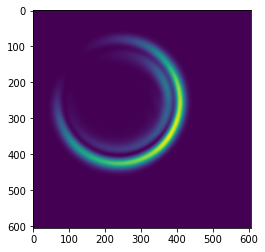

Predicted phi_CR -0.6713535189628601 rad -38.46572319782796 deg


Predicted Polarization plane -relative to the image plane w axis- is -0.33567675948143005 rad -19.23286159891398 deg


In [23]:
print("Referencia sin nada\n")
%matplotlib inline
image_full_path = "/home/oiangu/Desktop/Conical_Refraction_Polarimeter/LAB/EXPERIMENTAL/Fotos_Turpin/Day2/laser_gaussian_thesis/All_Taken_Photos/sin_los_dos_solo_tubo.png"
im = cv2.imread(image_full_path, cv2.IMREAD_ANYDEPTH)

im = np.asarray((compute_raw_to_centered_iX(torch.from_numpy(im).unsqueeze(0).to(device))).to('cpu').squeeze(0))
cv2.imwrite(f"/home/oiangu/Hippocampus/Conical_Refraction_Polarimeter/OUTPUT/LIBRARIES_OF_THEORETICAL_D/Basler_like_R0_300x_w0_300x_Z_50x_64bit/SIMULATIONS/UMAP_Regressor/TEST_IMAGES/sin_los_dos_solo_tubo.png", im)

plt.imshow(im)
plt.show()

model.eval()
embedding = torch.Tensor(umap_embedder.transform(np.expand_dims(im.flatten(),0))) # [1, embedding_dims]
predictions = model(embedding.to(device).unsqueeze(0))[0]
ref=predictions[0].item()
print(f"Predicted phi_CR {ref} rad {ref*180/np.pi} deg")
print(f"\n\nPredicted Polarization plane -relative to the image plane w axis- is {ref/2} rad {ref*180/np.pi/2} deg")

Referencia sin nada



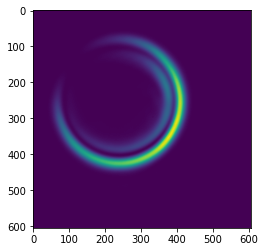

Predicted phi_CR -0.7294542193412781 rad -41.794648116265456 deg


Predicted Polarization plane -relative to the image plane w axis- is -0.36472710967063904 rad -20.897324058132728 deg


In [24]:
print("Referencia sin nada\n")
%matplotlib inline
image_full_path = "/home/oiangu/Desktop/Conical_Refraction_Polarimeter/LAB/EXPERIMENTAL/Fotos_Turpin/Day2/laser_gaussian_thesis/All_Taken_Photos/antes_de_la_estandar.png"
im = cv2.imread(image_full_path, cv2.IMREAD_ANYDEPTH)

im = np.asarray((compute_raw_to_centered_iX(torch.from_numpy(im).unsqueeze(0).to(device))).to('cpu').squeeze(0))
cv2.imwrite(f"/home/oiangu/Hippocampus/Conical_Refraction_Polarimeter/OUTPUT/LIBRARIES_OF_THEORETICAL_D/Basler_like_R0_300x_w0_300x_Z_50x_64bit/SIMULATIONS/UMAP_Regressor/TEST_IMAGES/antes_de_la_estandar.png", im)

plt.imshow(im)
plt.show()

model.eval()
embedding = torch.Tensor(umap_embedder.transform(np.expand_dims(im.flatten(),0))) # [1, embedding_dims]
predictions = model(embedding.to(device).unsqueeze(0))[0]
ref2=predictions[0].item()
print(f"Predicted phi_CR {ref2} rad {ref2*180/np.pi} deg")
print(f"\n\nPredicted Polarization plane -relative to the image plane w axis- is {ref2/2} rad {ref2*180/np.pi/2} deg")

Sin el negativo



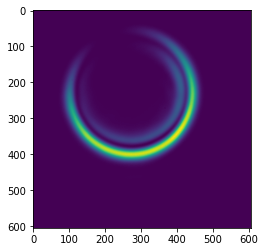

Predicted phi_CR -1.218261480331421 rad -69.80124116635037 deg


Predicted Polarization plane -relative to the image plane w axis- is -0.6091307401657104 rad -34.90062058317518 deg


In [25]:
print("Sin el negativo\n")
%matplotlib inline

image_full_path = "/home/oiangu/Desktop/Conical_Refraction_Polarimeter/LAB/EXPERIMENTAL/Fotos_Turpin/Day2/laser_gaussian_thesis/All_Taken_Photos/sin_el_negativo.png"
im = cv2.imread(image_full_path, cv2.IMREAD_ANYDEPTH)

im = np.asarray((compute_raw_to_centered_iX(torch.from_numpy(im).unsqueeze(0).to(device))).to('cpu').squeeze(0))
cv2.imwrite(f"/home/oiangu/Hippocampus/Conical_Refraction_Polarimeter/OUTPUT/LIBRARIES_OF_THEORETICAL_D/Basler_like_R0_300x_w0_300x_Z_50x_64bit/SIMULATIONS/UMAP_Regressor/TEST_IMAGES/sin_el_negativo.png", im)

plt.imshow(im)
plt.show()

model.eval()
embedding = torch.Tensor(umap_embedder.transform(np.expand_dims(im.flatten(),0))) # [1, embedding_dims]
predictions = model(embedding.to(device).unsqueeze(0))[0]
pos=predictions[0].item()
print(f"Predicted phi_CR {pos} rad {pos*180/np.pi} deg")
print(f"\n\nPredicted Polarization plane -relative to the image plane w axis- is {pos/2} rad {pos*180/np.pi/2} deg")

Sin el positivo



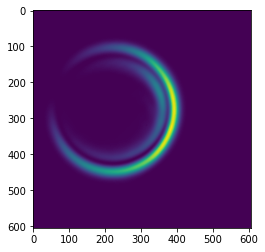

Predicted phi_CR -0.44929611682891846 rad -25.742771245913787 deg


Predicted Polarization plane -relative to the image plane w axis- is -0.22464805841445923 rad -12.871385622956893 deg


In [26]:
print("Sin el positivo\n")
%matplotlib inline

image_full_path = "/home/oiangu/Desktop/Conical_Refraction_Polarimeter/LAB/EXPERIMENTAL/Fotos_Turpin/Day2/laser_gaussian_thesis/All_Taken_Photos/sin_el_positivo.png"
im = cv2.imread(image_full_path, cv2.IMREAD_ANYDEPTH)

im = np.asarray((compute_raw_to_centered_iX(torch.from_numpy(im).unsqueeze(0).to(device))).to('cpu').squeeze(0))
cv2.imwrite(f"/home/oiangu/Hippocampus/Conical_Refraction_Polarimeter/OUTPUT/LIBRARIES_OF_THEORETICAL_D/Basler_like_R0_300x_w0_300x_Z_50x_64bit/SIMULATIONS/UMAP_Regressor/TEST_IMAGES/sin_el_positivo.png", im)

plt.imshow(im)
plt.show()

model.eval()
embedding = torch.Tensor(umap_embedder.transform(np.expand_dims(im.flatten(),0))) # [1, embedding_dims]
predictions = model(embedding.to(device).unsqueeze(0))[0]
neg = predictions[0].item()
print(f"Predicted phi_CR {neg} rad {neg*180/np.pi} deg")
print(f"\n\nPredicted Polarization plane -relative to the image plane w axis- is {neg/2} rad {neg*180/np.pi/2} deg")

Con ambos



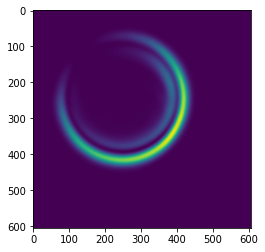

Predicted phi_CR -0.8314376473426819 rad -47.6378681210222 deg


Predicted Polarization plane -relative to the image plane w axis- is -0.41571882367134094 rad -23.8189340605111 deg


In [27]:
print("Con ambos\n")
%matplotlib inline

image_full_path = "/home/oiangu/Desktop/Conical_Refraction_Polarimeter/LAB/EXPERIMENTAL/Fotos_Turpin/Day2/laser_gaussian_thesis/All_Taken_Photos/con_los_dos.png"
im = cv2.imread(image_full_path, cv2.IMREAD_ANYDEPTH)

im = np.asarray((compute_raw_to_centered_iX(torch.from_numpy(im).unsqueeze(0).to(device))).to('cpu').squeeze(0))
cv2.imwrite(f"/home/oiangu/Hippocampus/Conical_Refraction_Polarimeter/OUTPUT/LIBRARIES_OF_THEORETICAL_D/Basler_like_R0_300x_w0_300x_Z_50x_64bit/SIMULATIONS/UMAP_Regressor/TEST_IMAGES/con_los_dos.png", im)

plt.imshow(im)
plt.show()

model.eval()
embedding = torch.Tensor(umap_embedder.transform(np.expand_dims(im.flatten(),0))) # [1, embedding_dims]
predictions = model(embedding.to(device).unsqueeze(0))[0]
both=predictions[0].item()
print(f"Predicted phi_CR {both} rad {both*180/np.pi} deg")
print(f"\n\nPredicted Polarization plane -relative to the image plane w axis- is {both/2} rad {both*180/np.pi/2} deg")


Ref Ort



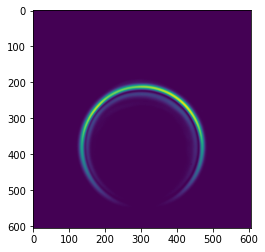

Predicted phi_CR 1.8975766897201538 rad 108.72313562337057 deg


Predicted Polarization plane -relative to the image plane w axis- is 0.9487883448600769 rad 54.36156781168528 deg


In [28]:
print("Ref Ort\n")
%matplotlib inline

image_full_path = "/home/oiangu/Desktop/Conical_Refraction_Polarimeter/LAB/EXPERIMENTAL/Fotos_Turpin/Day3/Reference/Reference__100.png"
im = cv2.imread(image_full_path, cv2.IMREAD_ANYDEPTH)

im = np.asarray((compute_raw_to_centered_iX(torch.from_numpy(im).unsqueeze(0).to(device))).to('cpu').squeeze(0))
cv2.imwrite( f"/home/oiangu/Hippocampus/Conical_Refraction_Polarimeter/OUTPUT/LIBRARIES_OF_THEORETICAL_D/Basler_like_R0_300x_w0_300x_Z_50x_64bit/SIMULATIONS/UMAP_Regressor/TEST_IMAGES/Reference__100.png", im)

plt.imshow(im)
plt.show()

model.eval()
embedding = torch.Tensor(umap_embedder.transform(np.expand_dims(im.flatten(),0))) # [1, embedding_dims]
predictions = model(embedding.to(device).unsqueeze(0))[0]
ref_ort=predictions[0].item()
print(f"Predicted phi_CR {ref_ort} rad {ref_ort*180/np.pi} deg")
print(f"\n\nPredicted Polarization plane -relative to the image plane w axis- is {ref_ort/2} rad {ref_ort*180/np.pi/2} deg")


Ort



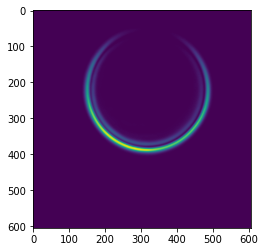

Predicted phi_CR 1.8975766897201538 rad -107.07083090087444 deg


Predicted Polarization plane -relative to the image plane w axis- is -0.9343692660331726 rad -53.53541545043722 deg


In [29]:
print("Ort\n")
%matplotlib inline

image_full_path = "/home/oiangu/Desktop/Conical_Refraction_Polarimeter/LAB/EXPERIMENTAL/Fotos_Turpin/Day3/Problem/90__100.png"
im = cv2.imread(image_full_path, cv2.IMREAD_ANYDEPTH)

im = np.asarray((compute_raw_to_centered_iX(torch.from_numpy(im).unsqueeze(0).to(device))).to('cpu').squeeze(0))
cv2.imwrite( f"/home/oiangu/Hippocampus/Conical_Refraction_Polarimeter/OUTPUT/LIBRARIES_OF_THEORETICAL_D/Basler_like_R0_300x_w0_300x_Z_50x_64bit/SIMULATIONS/UMAP_Regressor/TEST_IMAGES/90__100.png", im)
plt.imshow(im)
plt.show()

model.eval()
embedding = torch.Tensor(umap_embedder.transform(np.expand_dims(im.flatten(),0))) # [1, embedding_dims]
predictions = model(embedding.to(device).unsqueeze(0))[0]
ort=predictions[0].item()
print(f"Predicted phi_CR {ref_ort} rad {ort*180/np.pi} deg")
print(f"\n\nPredicted Polarization plane -relative to the image plane w axis- is {ort/2} rad {ort*180/np.pi/2} deg")


In [21]:
print(f"Positivo-Ref deberian ser {13.85} deg son {-(pos-ref)*180/np.pi/2} deg")
print(f"Negativo-Ref deberian ser {9.45} deg son {(neg-ref)*180/np.pi/2} deg")
print(f"Ambos-Ref deberian ser {4.4} deg son {-(both-ref)*180/np.pi/2} deg\n")

print(f"Positivo-Ref2 deberian ser {13.85} deg son {-(pos-ref2)*180/np.pi/2} deg")
print(f"Negativo-Ref2 deberian ser {9.45} deg son {(neg-ref2)*180/np.pi/2} deg")
print(f"Ambos-Ref2 deberian ser {4.4} deg son {-(both-ref2)*180/np.pi/2} deg\n")

print(f"Ref2-Ref deberian ser {0} deg son {(ref2-ref)*180/np.pi/2} deg\n")

print(f"El de noventa deberian ser {90} deg son {(ref_ort-ort)*180/np.pi/2} deg")

Positivo-Ref deberian ser 13.85 deg son 13.286737964121832 deg
Negativo-Ref deberian ser 9.45 deg son 8.71368811195099 deg
Ambos-Ref deberian ser 4.4 deg son 3.1403092445075926 deg

Positivo-Ref2 deberian ser 13.85 deg son 13.556445058972711 deg
Negativo-Ref2 deberian ser 9.45 deg son 8.443981017100112 deg
Ambos-Ref2 deberian ser 4.4 deg son 3.410016339358471 deg

Ref2-Ref deberian ser 0 deg son 0.2697070948508785 deg

El de noventa deberian ser 90 deg son 107.27503989667947 deg


In [21]:
from time import time
nimss=[1,2,3,4,5,10,20,40,60]
times=[]
for nims in nimss:
    t0=time()
    images=np.zeros((nims, (2*X+1)**2), dtype=np.float32)
    for i in range(nims):
        images[i,:] = training_data[i][0].flatten()
    a = torch.Tensor(umap_embedder.transform(images))
    t1=time()
    times.append(t1-t0)
    print(nimss, times)

[1, 2, 3, 4, 5, 10, 20, 40, 60] [3.1489973068237305]
[1, 2, 3, 4, 5, 10, 20, 40, 60] [3.1489973068237305, 4.43294358253479]
[1, 2, 3, 4, 5, 10, 20, 40, 60] [3.1489973068237305, 4.43294358253479, 5.951560735702515]
[1, 2, 3, 4, 5, 10, 20, 40, 60] [3.1489973068237305, 4.43294358253479, 5.951560735702515, 6.71141505241394]
[1, 2, 3, 4, 5, 10, 20, 40, 60] [3.1489973068237305, 4.43294358253479, 5.951560735702515, 6.71141505241394, 8.350321531295776]
[1, 2, 3, 4, 5, 10, 20, 40, 60] [3.1489973068237305, 4.43294358253479, 5.951560735702515, 6.71141505241394, 8.350321531295776, 15.662988424301147]
[1, 2, 3, 4, 5, 10, 20, 40, 60] [3.1489973068237305, 4.43294358253479, 5.951560735702515, 6.71141505241394, 8.350321531295776, 15.662988424301147, 27.167689085006714]
[1, 2, 3, 4, 5, 10, 20, 40, 60] [3.1489973068237305, 4.43294358253479, 5.951560735702515, 6.71141505241394, 8.350321531295776, 15.662988424301147, 27.167689085006714, 52.14728355407715]
[1, 2, 3, 4, 5, 10, 20, 40, 60] [3.1489973068237305

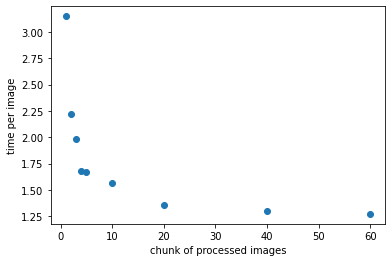

In [26]:
plt.plot(nimss, [time/nims for time, nims in zip(times, nimss)], 'o')
plt.ylabel("time per image")
plt.xlabel("chunk of processed images")
plt.title("Sin usar dataloader")
plt.show()

In [35]:
from time import time
nimss=[1,2,3,4,5,10,20,40,60]
times=[]
for nims in nimss:
    train_dataloader = DataLoader(training_data, batch_size=nims, shuffle=True, num_workers=2,
                              pin_memory=True, drop_last=False, persistent_workers=False)
    t0=time()
    images, labs = next(iter(train_dataloader))
    t1=time()
    times.append(t1-t0)
    print(nimss, times)

[1, 2, 3, 4, 5, 10, 20, 40, 60] [7.3262975215911865]
[1, 2, 3, 4, 5, 10, 20, 40, 60] [7.3262975215911865, 17.49277925491333]
[1, 2, 3, 4, 5, 10, 20, 40, 60] [7.3262975215911865, 17.49277925491333, 16.2593035697937]
[1, 2, 3, 4, 5, 10, 20, 40, 60] [7.3262975215911865, 17.49277925491333, 16.2593035697937, 23.728442668914795]
[1, 2, 3, 4, 5, 10, 20, 40, 60] [7.3262975215911865, 17.49277925491333, 16.2593035697937, 23.728442668914795, 31.327791213989258]
[1, 2, 3, 4, 5, 10, 20, 40, 60] [7.3262975215911865, 17.49277925491333, 16.2593035697937, 23.728442668914795, 31.327791213989258, 41.47978091239929]
[1, 2, 3, 4, 5, 10, 20, 40, 60] [7.3262975215911865, 17.49277925491333, 16.2593035697937, 23.728442668914795, 31.327791213989258, 41.47978091239929, 84.40457129478455]
[1, 2, 3, 4, 5, 10, 20, 40, 60] [7.3262975215911865, 17.49277925491333, 16.2593035697937, 23.728442668914795, 31.327791213989258, 41.47978091239929, 84.40457129478455, 166.68002605438232]
[1, 2, 3, 4, 5, 10, 20, 40, 60] [7.32629

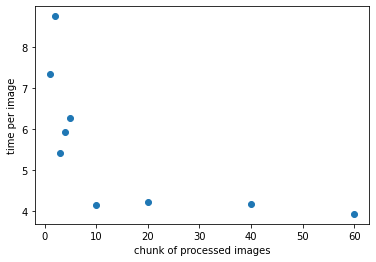

In [36]:
plt.plot(nimss, [time/nims for time, nims in zip(times, nimss)], 'o')
plt.ylabel("time per image")
plt.xlabel("chunk of processed images")
plt.title("Workers 2")
plt.show()

In [37]:
from time import time
nimss=[1,2,3,4,5,10,20,40,60]
times=[]
for nims in nimss:
    train_dataloader = DataLoader(training_data, batch_size=nims, shuffle=True, num_workers=5,
                              pin_memory=True, drop_last=False, persistent_workers=False)
    t0=time()
    images, labs = next(iter(train_dataloader))
    t1=time()
    times.append(t1-t0)
    print(nimss, times)

[1, 2, 3, 4, 5, 10, 20, 40, 60] [8.490159511566162]
[1, 2, 3, 4, 5, 10, 20, 40, 60] [8.490159511566162, 13.74122667312622]
[1, 2, 3, 4, 5, 10, 20, 40, 60] [8.490159511566162, 13.74122667312622, 24.181958198547363]
[1, 2, 3, 4, 5, 10, 20, 40, 60] [8.490159511566162, 13.74122667312622, 24.181958198547363, 39.40571355819702]
[1, 2, 3, 4, 5, 10, 20, 40, 60] [8.490159511566162, 13.74122667312622, 24.181958198547363, 39.40571355819702, 31.851186752319336]
[1, 2, 3, 4, 5, 10, 20, 40, 60] [8.490159511566162, 13.74122667312622, 24.181958198547363, 39.40571355819702, 31.851186752319336, 72.05476903915405]
[1, 2, 3, 4, 5, 10, 20, 40, 60] [8.490159511566162, 13.74122667312622, 24.181958198547363, 39.40571355819702, 31.851186752319336, 72.05476903915405, 105.09947872161865]
[1, 2, 3, 4, 5, 10, 20, 40, 60] [8.490159511566162, 13.74122667312622, 24.181958198547363, 39.40571355819702, 31.851186752319336, 72.05476903915405, 105.09947872161865, 179.39525055885315]
[1, 2, 3, 4, 5, 10, 20, 40, 60] [8.4901

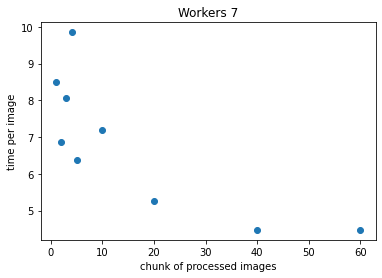

In [38]:
plt.plot(nimss, [time/nims for time, nims in zip(times, nimss)], 'o')
plt.ylabel("time per image")
plt.xlabel("chunk of processed images")
plt.title("Workers 7")
plt.show()